# 6. Plot All Results

gg-napari-env

In [1]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.measure import regionprops
from napari_czifile2 import napari_get_reader
from skimage import io
import os 
import pandas as pd
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings("ignore")

In [2]:
def plot_2_channels(results, c1, c2, c1_name, c2_name, c1_color, c2_color, coordinates, 
                    image, metadata, all_rois, cell_borders, input, file, 
                    pixel_bounds=100, bbox_expansion=5, 
                    dapi_max=255, c1_max=255, c2_max=255): 
    
    # Remove -T from column names
    results.columns = results.columns.str.split('-T').str[0]

    # Make figure directory
    figure_dir = f'../figures/model_B_only_OSNs/{input}/{file.replace(".czi", "")}-{c1_name}-{c2_name}'
    if not os.path.exists(figure_dir):
        os.makedirs(figure_dir)

    # Clear directory
    for f in os.listdir(figure_dir):
        os.remove(os.path.join(figure_dir, f))

    # Scatter Plot 
    f, ax = plt.subplots(1, 1, figsize=(2, 2), dpi = 400) 
    sns.scatterplot(data=results[(results[c1] < 1.45) & (results[c2] < 1.45)], x=c1, y=c2, s=2, ax=ax, color='black', alpha=0.3, lw=0)

    # Plot coordinates using the data from the image 
    results_image = results[(results['image'] == file)].reset_index(drop=True)
    random_colors = sns.color_palette('colorblind', len(coordinates))
    cells = [] 
    for i, coord in enumerate(coordinates): 
        cell_idx = np.argmin(np.linalg.norm(results_image[[c1, c2]].values - coord, axis=1))
        cell = results_image.iloc[cell_idx].copy()  
        sns.scatterplot(data=pd.DataFrame([cell]), x=c1, y=c2, color=random_colors[i], s=30, ax=ax, lw=0, alpha=1)
        cell["color"] = random_colors[i] 
        cell["number"] = i + 1
        cells.append(cell)
    cells = pd.DataFrame(cells)

    # Plotting 
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"{c1_name}", fontsize=6) 
    ax.set_ylabel(f"{c2_name}", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)
    ax.set_ylim(-0.05, 1.55) 
    ax.set_xlim(-0.05, 1.55)
    ax.set_xticks([0, 0.5, 1, 1.5])
    ax.set_yticks([0, 0.5, 1, 1.5])

    plt.tight_layout()
    plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-scatter.png", format="png", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()

    # Get scale for scale bar 
    x_scale_5 = 5 / metadata['scale'][2] # 5 um in pixels 

    def set_min_max(channel, min_val, max_val):
        if min_val == max_val:
            return np.zeros_like(channel)  # If min == max, return all zeros
        clipped = np.clip(channel, min_val, max_val)
        rescaled = (clipped - min_val) / (max_val - min_val) * 255
        return np.clip(rescaled, 0, 255)  # Ensure the values remain in the [0, 255] range

    # Remove -border from c1 and c2 names
    c1 = c1.split('-')[0]
    c2 = c2.split('-')[0]

    channels = [(i, metadata['name'][i]) for i in range(len(metadata['name']))]
    channels = [(i, channel) for i, channel in channels if any([name in channel for name in ["DAPI", c1, c2]])]

    for i, cell in cells.iterrows():
        # Retrieve image and z slice 
        x_bounds = int(cell['centroid_x']) - pixel_bounds, int(cell['centroid_x']) + pixel_bounds 
        y_bounds = int(cell['centroid_y']) - pixel_bounds, int(cell['centroid_y']) + pixel_bounds 
        cell_image = image[0, cell['z'], :, y_bounds[0]:y_bounds[1], x_bounds[0]:x_bounds[1]]  # shape: (channels, H, W)
        
        # Create composite RGB image
        rgb_image = np.zeros((cell_image.shape[1], cell_image.shape[2], 3), dtype=float)  # (H, W, 3)

        # -- DAPI (Grey): add to all channels
        dapi = [idx for idx, channel in channels if 'DAPI' in channel][0]
        dapi_adjusted = set_min_max(cell_image[dapi], 0, dapi_max)
        rgb_image[..., 0] += dapi_adjusted  # Red
        rgb_image[..., 1] += dapi_adjusted  # Green
        rgb_image[..., 2] += dapi_adjusted  # Blue

        # C1 
        c1_index = [idx for idx, channel in channels if c1 in channel][0]
        c1_adjusted = set_min_max(cell_image[c1_index], 0, c1_max) 
        if c1_color == "magenta": 
            rgb_image[..., 0] += c1_adjusted  
            rgb_image[..., 2] += c1_adjusted  
        elif c1_color == "cyan": 
            rgb_image[..., 1] += c1_adjusted
            rgb_image[..., 2] += c1_adjusted
        elif c1_color == "yellow": 
            rgb_image[..., 0] += c1_adjusted
            rgb_image[..., 1] += c1_adjusted

        # -- Cyan (c2): add to green and blue
        c2_index = [idx for idx, channel in channels if c2 in channel][0]
        c2_adjusted = set_min_max(cell_image[c2_index], 0, c2_max)
        if c2_color == "magenta": 
            rgb_image[..., 0] += c2_adjusted  
            rgb_image[..., 2] += c2_adjusted  
        elif c2_color == "cyan": 
            rgb_image[..., 1] += c2_adjusted
            rgb_image[..., 2] += c2_adjusted
        elif c2_color == "yellow": 
            rgb_image[..., 0] += c2_adjusted
            rgb_image[..., 1] += c2_adjusted

        # Normalize composite image to [0,1]
        rgb_image = np.clip(rgb_image/255, 0, 1)

        # Load ROIs and compute bbox (adjusted relative to the cell image)
        regions = regionprops(all_rois[cell['z'], :, :])
        region_labels = [region.label for region in regions]
        region = regions[region_labels.index(cell['z_id'])]
        bbox = region.bbox
        # Expand bbox by bbox_expansion pixels     
        bbox = (bbox[0] - bbox_expansion, bbox[1] - bbox_expansion, 
                bbox[2] + bbox_expansion, bbox[3] + bbox_expansion)
        # Adjust bbox to cell_image coordinates
        bbox = (bbox[0] - y_bounds[0], bbox[1] - x_bounds[0],
                bbox[2] - y_bounds[0], bbox[3] - x_bounds[0])
        # For clarity, unpack bbox (top, left, bottom, right)
        y1, x1, y2, x2 = bbox

        # Create figure with gridspec: main image in left column (spanning all rows) 
        # and three zoom panels in the right column (each taking 1/3 height)
        # Adjust fig size and width ratios as needed.
        fig_width = 1.0   # total width (main image + zoom panels)
        fig_height = 0.75  # height of the main image (zoom panels share this height)
        f = plt.figure(figsize=(fig_width, fig_height), dpi=400)
        gs = gridspec.GridSpec(nrows=3, ncols=2, width_ratios=[4, 1])
        ax_main = f.add_subplot(gs[:, 0])
        ax_zoom_gray = f.add_subplot(gs[0, 1])
        ax_zoom_magenta = f.add_subplot(gs[1, 1])
        ax_zoom_cyan = f.add_subplot(gs[2, 1])

        # Plot main composite image
        ax_main.imshow(rgb_image)
        ax_main.axis("off")
        # Add border to main image
        ax_main.add_patch(plt.Rectangle((0, 0), cell_image.shape[2]-1, cell_image.shape[1]-1, fill=False, edgecolor=cell['color'], lw=2))
        # Add text legends on main image
        ax_main.text(5, 25, "DAPI", color='white', fontsize=6, weight='regular')
        ax_main.text(5, 45, c1_name, color=c1_color, fontsize=6, weight='regular')
        ax_main.text(5, 65, c2_name, color=c2_color, fontsize=6, weight='regular')
        # Add scale bar on main image
        ax_main.plot([2*pixel_bounds-20-x_scale_5, 2*pixel_bounds-20], 
                    [2*pixel_bounds-20, 2*pixel_bounds-20], color='white', lw=1)
        
        ax_main.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='white', lw=1))

        # ----- Create zoom panels -----
        # Zoom for Grey (DAPI)
        zoom_dapi = dapi_adjusted[y1:y2, x1:x2]
        # Build RGB image: all channels get the DAPI intensity
        dapi_zoom = np.zeros((zoom_dapi.shape[0], zoom_dapi.shape[1], 3), dtype=float)
        dapi_zoom[..., 0] = zoom_dapi
        dapi_zoom[..., 1] = zoom_dapi
        dapi_zoom[..., 2] = zoom_dapi
        dapi_zoom = np.clip(dapi_zoom/255, 0, 1)
        ax_zoom_gray.imshow(dapi_zoom)
        ax_zoom_gray.axis("off")
        ax_zoom_gray.add_patch(plt.Rectangle((0, 0), zoom_dapi.shape[1]-1, zoom_dapi.shape[0]-1, fill=False, edgecolor='grey', lw=1))
        
        """# Plot cell border on zoom panel in red 
        # Get cell border 
        cell_border = cell_borders[cell['z'], :, :] == cell['z_id']
        cell_border = cell_border[y_bounds[0]:y_bounds[1], x_bounds[0]:x_bounds[1]]
        cell_border = cell_border[y1:y2, x1:x2]
        # Make background transparent and set cell border pixels to red 
        cell_border_rgba = np.zeros((cell_border.shape[0], cell_border.shape[1], 4), dtype=float)
        cell_border_rgba[cell_border, 0] = 1 # Red channel
        cell_border_rgba[cell_border, 3] = 0.5 # Alpha channel
        # Plot RGBA image on top of the same zoom panel
        #ax_zoom_gray.imshow(cell_border_rgba, alpha=1)"""

        # Zoom for Magenta (c1)
        zoom_c1 = c1_adjusted[y1:y2, x1:x2]
        # Build an RGB image: red and blue channels from c1
        zoom_c1_rgb = np.zeros((zoom_c1.shape[0], zoom_c1.shape[1], 3), dtype=float)
        if c1_color == "magenta": 
            zoom_c1_rgb[..., 0] += zoom_c1  
            zoom_c1_rgb[..., 2] += zoom_c1  
        elif c1_color == "cyan": 
            zoom_c1_rgb[..., 1] += zoom_c1
            zoom_c1_rgb[..., 2] += zoom_c1
        elif c1_color == "yellow": 
            zoom_c1_rgb[..., 0] += zoom_c1
            zoom_c1_rgb[..., 1] += zoom_c1
        zoom_c1_rgb = np.clip(zoom_c1_rgb/255, 0, 1)
        ax_zoom_magenta.imshow(zoom_c1_rgb)
        ax_zoom_magenta.axis("off")
        ax_zoom_magenta.add_patch(plt.Rectangle((0, 0), zoom_c1.shape[1]-1, zoom_c1.shape[0]-1, fill=False, edgecolor=c1_color, lw=1))
        #ax_zoom_magenta.imshow(cell_border_rgba, alpha=0.5)

        # Zoom for Cyan (c2)
        zoom_c2 = c2_adjusted[y1:y2, x1:x2]
        # Build an RGB image: green and blue channels from c2
        zoom_c2_rgb = np.zeros((zoom_c2.shape[0], zoom_c2.shape[1], 3), dtype=float)
        if c2_color == "magenta": 
            zoom_c2_rgb[..., 0] += zoom_c2  
            zoom_c2_rgb[..., 2] += zoom_c2  
        elif c2_color == "cyan": 
            zoom_c2_rgb[..., 1] += zoom_c2
            zoom_c2_rgb[..., 2] += zoom_c2
        elif c2_color == "yellow": 
            zoom_c2_rgb[..., 0] += zoom_c2
            zoom_c2_rgb[..., 1] += zoom_c2
        zoom_c2_rgb = np.clip(zoom_c2_rgb/255, 0, 1)
        ax_zoom_cyan.imshow(zoom_c2_rgb)
        ax_zoom_cyan.axis("off")
        ax_zoom_cyan.add_patch(plt.Rectangle((0, 0), zoom_c2.shape[1]-1, zoom_c2.shape[0]-1, fill=False, edgecolor=c2_color, lw=1))
        #ax_zoom_cyan.imshow(cell_border_rgba, alpha=0.5)

        plt.tight_layout(pad=0)
        plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-cell_{cell["number"]}.png", format="png", pad_inches=0, bbox_inches='tight', transparent=False)
        plt.show()


In [3]:
raw_data_dirs = os.listdir('../../../RNA-FISH-raw-data/')
# Get directories that contains 488, 546 or 647 
raw_data_dirs = [x for x in raw_data_dirs if '488' in x or '546' in x or '647' in x]
raw_data_dirs

['20250508 P14 T 9E89-b1-546 9E99-B2-647 DAPI',
 '20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi',
 '20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI',
 '20250328 1 P14 T79-intergenic-b2-647 T79-exonic-b1-546 DAPI',
 '20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI',
 '20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi',
 '20250508 P14 T 9E99-b2-594 LOC105286072-B5-647 DAPI',
 '20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI',
 '20250523 C P14 T U54-647 Lnc4-546 DAPI',
 '20250523 A P14 T 9E213-546 9E214-488 Intergenic-647 DAPI',
 '20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi',
 '20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI',
 '20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi',
 '20250523 B P14 T 9E88-546 Lnc-647 DAPI']

In [4]:
normalization_quantile = 0.001
valence_OR_nuc_norm_threshold = 0.7 
valence_OR_size_threshold = 400
valence_OR_border_threshold = 100 
coexpression_nuc_norm_threshold = 0.1
cyto_norm_threshold = 0.2

## T79

In [7]:
input = 'T79'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
results_dir = f'../results/{input}'
results_files = os.listdir(results_dir)
results_files = [f for f in results_files if f.endswith('with_borders.csv')]

# Load all results 
results = pd.DataFrame() 
for f in results_files:
    results_path = os.path.join(results_dir, f)
    results_individual = pd.read_csv(results_path)
    results_individual.columns = results_individual.columns.str.split('-T').str[0]
    results = pd.concat([results, results_individual], axis=0) 
results = results.reset_index(drop=True)

Using 20250328 1 P14 T79-intergenic-b2-647 T79-exonic-b1-546 DAPI as input directory


In [8]:
# Print the sample size 
print(f"Sample size: {len(results['image'].unique())} images")

Sample size: 5 images


In [9]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [10]:
channels = ['AF546', 'AF647']
channel_names = ["T79 exons", "T79 intergenics"]
channel_colors = ["magenta", "cyan"]
channel_maxs = [255, 255]

In [11]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        normalized = (nucleus_mean_signal - lower) / (upper - lower)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = normalized

In [12]:
# Correlation of AF546-nuc-norm and AF647-nuc-norm
from scipy.stats import pearsonr
R, p = pearsonr(results['AF546-nuc-norm'], results['AF647-nuc-norm'])
print(f"Pearson correlation: {R:.2f}, p-value: {p:.2e}")

# Spearman 
from scipy.stats import spearmanr
R, p = spearmanr(results['AF546-nuc-norm'], results['AF647-nuc-norm'])
print(f"Spearman correlation: {R:.2f}, p-value: {p:.2e}")

Pearson correlation: 0.81, p-value: 0.00e+00
Spearman correlation: 0.47, p-value: 0.00e+00


In [13]:
file_number = 1
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../../../RNA-FISH-raw-data/20250328 1 P14 T79-intergenic-b2-647 T79-exonic-b1-546 DAPI/20250328 1 T79 sample 5.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 29836.52081298828, 34079.996032714844), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 78, 3, 2048, 2048)
Loaded ../results/20250328 1 P14 T79-intergenic-b2-647 T79-exonic-b1-546 DAPI/20250328 1 T79 sample 5_rois.npy


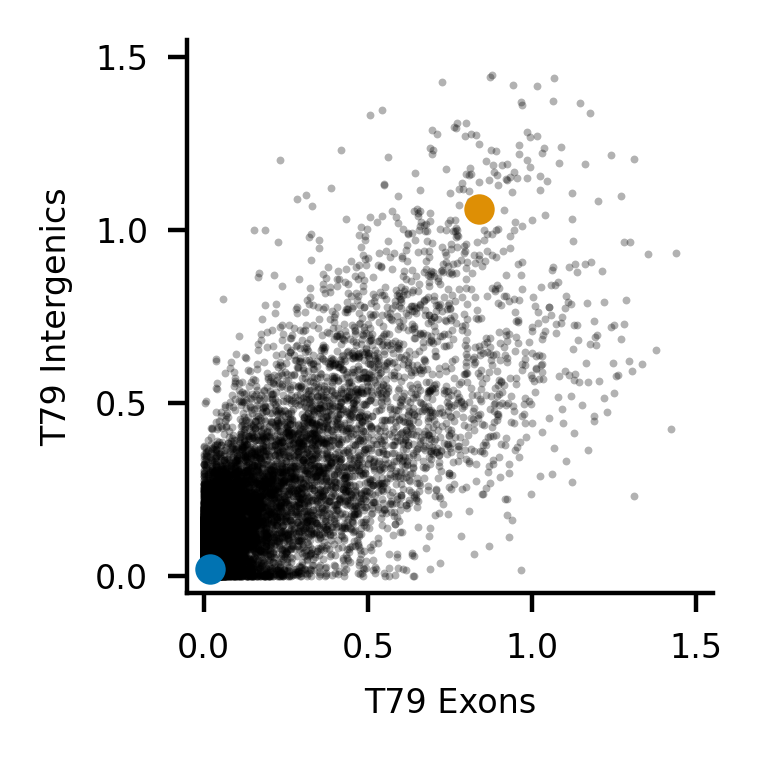

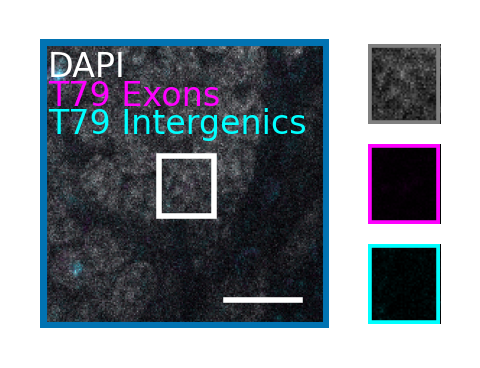

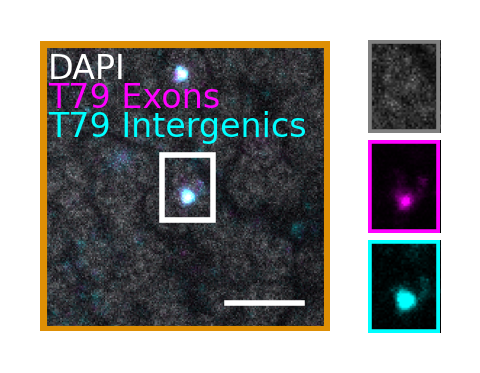

In [14]:
# T79-intergenic-b2-647 T79-exonic-b1-546 
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=None, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="T79 Exons", c2_name="T79 Intergenics",
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0.02, 0.02], [0.9, 1]],
                dapi_max=200, c1_max=200, c2_max=200)

## Chymotrypsin & U34

In [5]:
input = 'U34'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI as input directory


In [6]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [7]:
channels = ['AF546', 'AF647']
channel_names = ["U34", "Chymotrypsin"]
channel_colors = ["cyan", "yellow"]
channel_maxs = [255, 255]

In [8]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)

manual_cytoplasmic_channels = results['cytoplasmic'].value_counts().index.tolist()
for channel in manual_cytoplasmic_channels: 
    num_cells = results[results['cytoplasmic'] == channel].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation: {num_cells}")
    num_cells_with_valence_OR = results[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'])].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation and valence OR annotation: {num_cells_with_valence_OR}")
    nuc_norm = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-nuc-norm"].mean()
    print(f"Missing cells mean {channel} nucleus normalized signal: {nuc_norm:.2f}")
    rel_cyto = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-cyto-norm"].mean()
    print(f"Missing cells mean {channel} cytoplasmic normalized signal: {rel_cyto:.2f}")


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF546 cytoplasmic annotation: 60
Number of cells with AF546 cytoplasmic annotation and valence OR annotation: 58
Missing cells mean AF546 nucleus normalized signal: 1.00
Missing cells mean AF546 cytoplasmic normalized signal: 0.06
Number of cells with AF647 cytoplasmic annotation: 57
Number of cells with AF647 cytoplasmic annotation and valence OR annotation: 37
Missing cells mean AF647 nucleus normalized signal: 0.93
Missing cells mean AF647 cytoplasmic normalized signal: 0.16


,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250307 B1 Sample 1 Stack.czi,24,1,291,388.0,AF546,1.109211,AF546,1.200030,U34,U34 valence OR
1,20250307 B1 Sample 1 Stack.czi,24,2,298,732.0,AF546,0.668089,AF546,0.891906,U34,U34 valence OR
2,20250307 B1 Sample 1 Stack.czi,26,1,270,448.0,AF546,0.461885,AF546,0.867515,U34,U34 valence OR
3,20250307 B1 Sample 1 Stack.czi,78,125,228,685.0,AF546,0.434288,AF546,0.899022,U34,U34 valence OR
4,20250307 B1 Sample 1 Stack.czi,79,124,219,754.0,AF546,0.501985,AF546,1.105218,U34,U34 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
713,20250307 B1 Sample 4 Stack.czi,158,154,301,1004.0,AF647,0.418996,AF647,1.229138,Chymotrypsin,Chymotrypsin valence OR
714,20250307 B1 Sample 4 Stack.czi,159,144,321,1045.0,AF647,0.418327,AF647,0.752243,Chymotrypsin,Chymotrypsin valence OR
715,20250307 B1 Sample 4 Stack.czi,159,243,253,682.0,AF647,0.389844,AF647,0.810937,Chymotrypsin,Chymotrypsin valence OR
716,20250307 B1 Sample 4 Stack.czi,168,14,221,788.0,AF647,0.208331,AF647,0.754739,Chymotrypsin,Chymotrypsin valence OR


<Axes: >

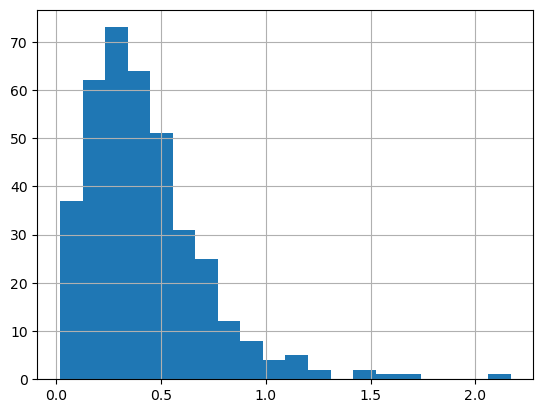

In [9]:
results_melted.loc[(results_melted['valence_OR_name'] == "U34 valence OR") & 
                   (results_melted['channel_name'] == "Chymotrypsin")]['nuc-norm'].hist(bins=20)

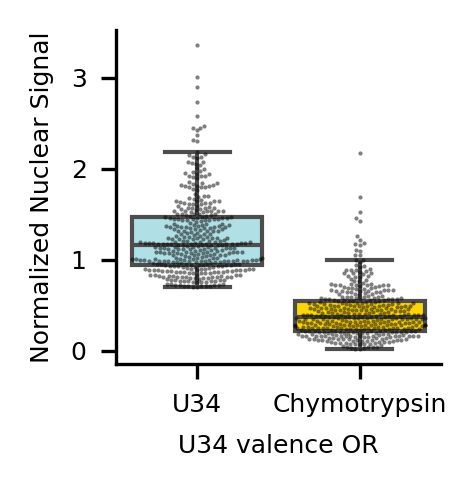

In [10]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U34", "Chymotrypsin"]
plot_colors = ['powderblue', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

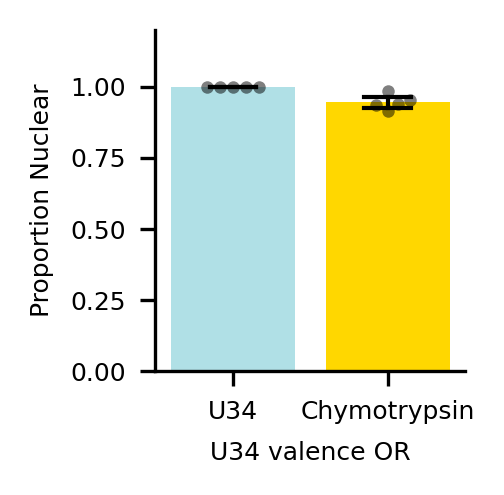

In [11]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U34", "Chymotrypsin"]
plot_colors = ['powderblue', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

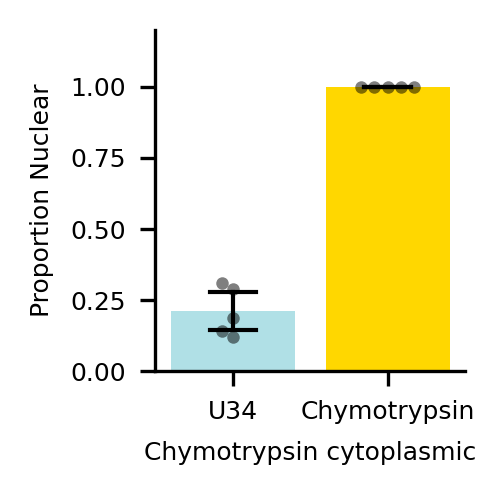

In [12]:
valence_channel = "Chymotrypsin valence OR"
channels_to_plot = ["U34", "Chymotrypsin"]
plot_colors = ['powderblue', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"Chymotrypsin cytoplasmic", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

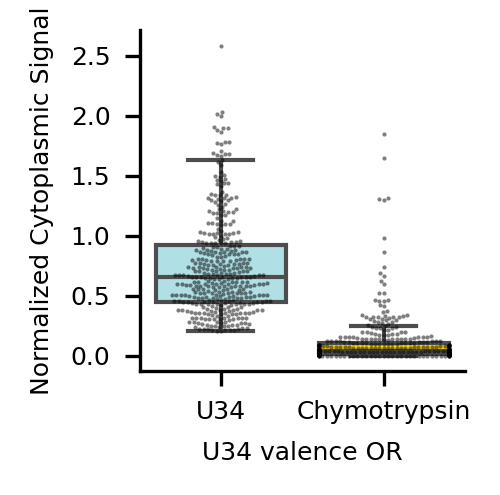

In [13]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U34", "Chymotrypsin"]
plot_colors = ['powderblue', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

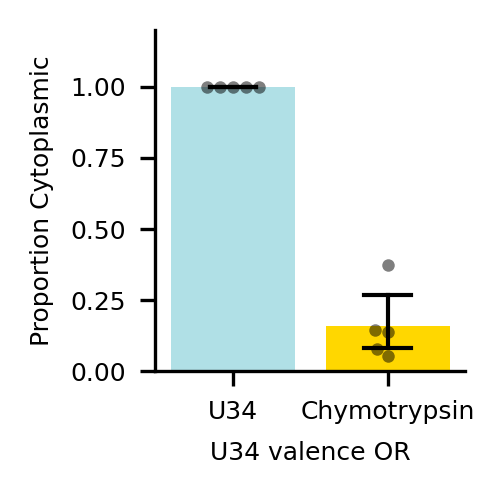

In [14]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U34", "Chymotrypsin"]
plot_colors = ['powderblue', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

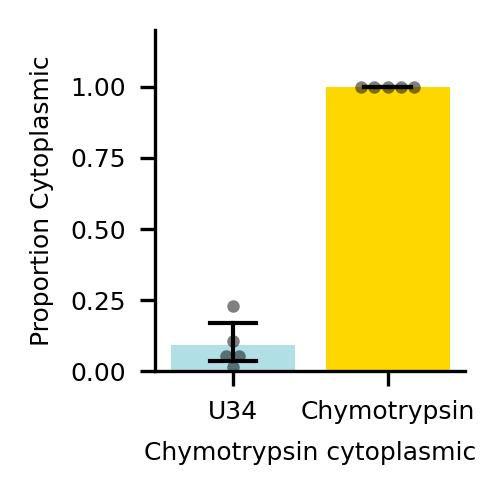

In [15]:
valence_channel = "Chymotrypsin valence OR"
channels_to_plot = ["U34", "Chymotrypsin"]
plot_colors = ['powderblue', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"Chymotrypsin cytoplasmic", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

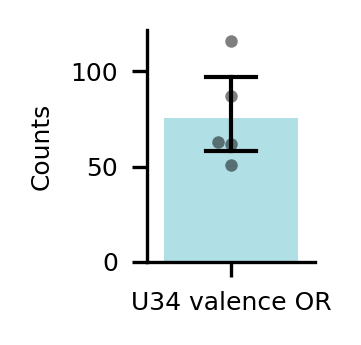

In [16]:
# Plot the number of cells 
valence_channel = "U34 valence OR"
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('cytoplasmic', '\ncytoplasmic')
f, ax = plt.subplots(1, 1, figsize=(1.25, 1.25), dpi = 300) 
valence_counts_subset = valence_counts[valence_counts["valence_OR_name"] == valence_channel]
sns.barplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, palette=['powderblue'], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [17]:
file_number = 0 
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI/20250307 B1 Sample 5 Stack.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 0.5, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 202, 3, 2048, 2048)
Loaded ../results/20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI/20250307 B1 Sample 5 Stack_rois.npy
Loaded ../results/20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI/20250307 B1 Sample 5 Stack_cell_borders.npy


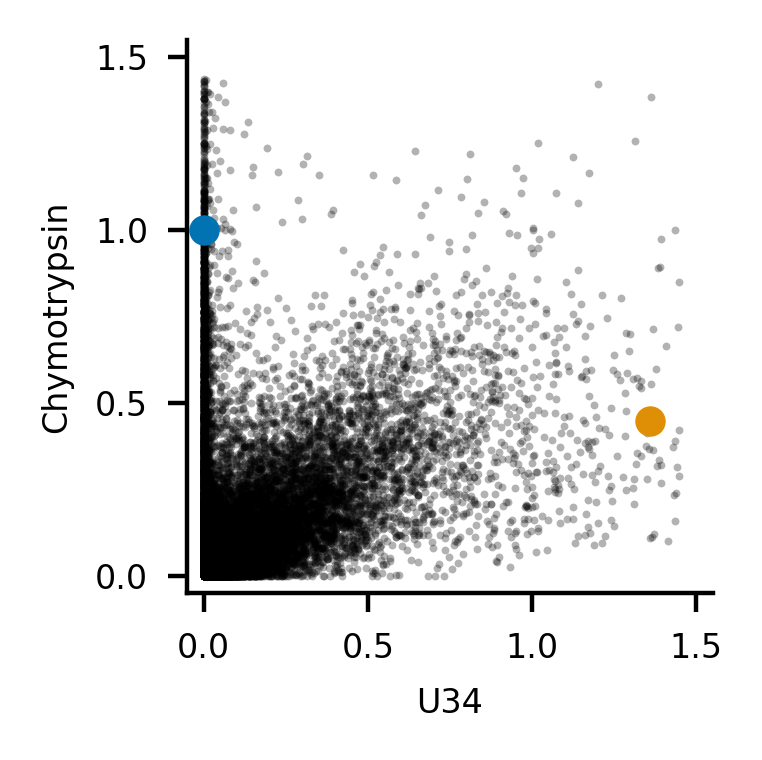

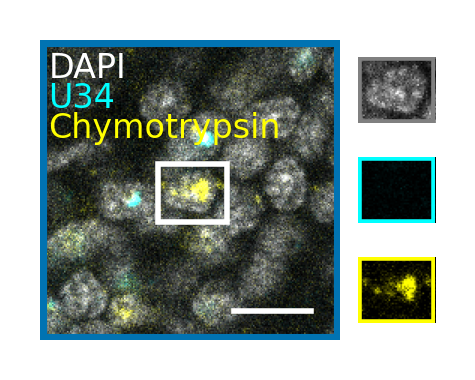

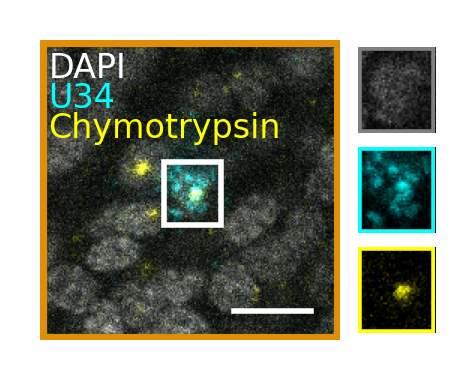

In [19]:
# U34-B3-546 Chymotrypsin-B2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="U34", c2_name="Chymotrypsin",
                c1_color="cyan", c2_color="yellow",
                coordinates=[[0, 1], [1.4, 0.5]], 
                dapi_max=200, c1_max=100, c2_max=100)

## U34, U21, PR

In [29]:
input = 'u21'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi as input directory


In [30]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [31]:
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["U34", "PR", "U21"]
channel_colors = ["yellow", "magenta", "cyan"]
channel_maxs = [255, 255, 255]

In [32]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)

manual_cytoplasmic_channels = results['cytoplasmic'].value_counts().index.tolist()
for channel in manual_cytoplasmic_channels: 
    num_cells = results[results['cytoplasmic'] == channel].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation: {num_cells}")
    num_cells_with_valence_OR = results[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'])].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation and valence OR annotation: {num_cells_with_valence_OR}")
    nuc_norm = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-nuc-norm"].mean()
    print(f"Missing cells mean {channel} nucleus normalized signal: {nuc_norm:.2f}")
    rel_cyto = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-cyto-norm"].mean()
    print(f"Missing cells mean {channel} cytoplasmic normalized signal: {rel_cyto:.2f}")


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF647 cytoplasmic annotation: 84
Number of cells with AF647 cytoplasmic annotation and valence OR annotation: 51
Missing cells mean AF647 nucleus normalized signal: 0.68
Missing cells mean AF647 cytoplasmic normalized signal: 0.15
Number of cells with AF488 cytoplasmic annotation: 46
Number of cells with AF488 cytoplasmic annotation and valence OR annotation: 41
Missing cells mean AF488 nucleus normalized signal: 0.80
Missing cells mean AF488 cytoplasmic normalized signal: 0.07


,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250325 4 t19 lncrna sample 1 great.czi,10,182,124,322.0,AF488,1.189690,AF488,1.224413,U34,U34 valence OR
1,20250325 4 t19 lncrna sample 1 great.czi,10,282,131,564.0,AF488,0.287343,AF488,0.723285,U34,U34 valence OR
2,20250325 4 t19 lncrna sample 1 great.czi,11,200,234,719.0,AF488,0.746509,AF488,1.381559,U34,U34 valence OR
3,20250325 4 t19 lncrna sample 1 great.czi,12,133,299,845.0,AF488,0.968210,AF488,1.234904,U34,U34 valence OR
4,20250325 4 t19 lncrna sample 1 great.czi,12,188,204,821.0,AF488,1.061252,AF488,1.096221,U34,U34 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
796,20250325 4 t19 lncrna sample 4 great.czi,69,286,157,291.0,AF647,0.742148,AF647,1.077976,U21,U21 valence OR
797,20250325 4 t19 lncrna sample 4 great.czi,72,141,214,473.0,AF647,0.280594,AF647,0.776918,U21,U21 valence OR
798,20250325 4 t19 lncrna sample 4 great.czi,74,78,237,755.0,AF647,0.425548,AF647,1.026747,U21,U21 valence OR
799,20250325 4 t19 lncrna sample 4 great.czi,75,62,292,889.0,AF647,0.369528,AF647,1.208388,U21,U21 valence OR


<Axes: >

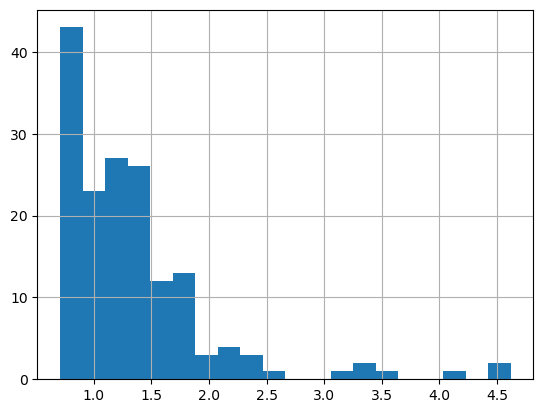

In [33]:
results_melted.loc[(results_melted['valence_OR_name'] == "U34 valence OR") & 
                   (results_melted['channel_name'] == "U34")]['nuc-norm'].hist(bins=20)

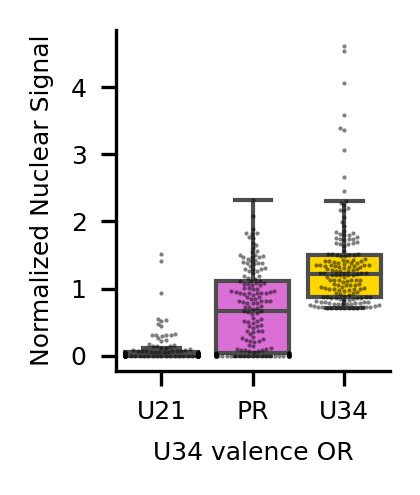

In [34]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

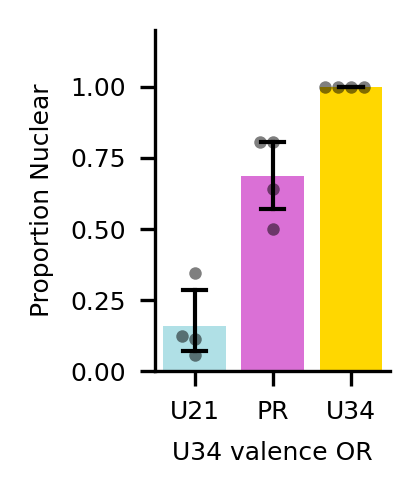

In [35]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors =['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

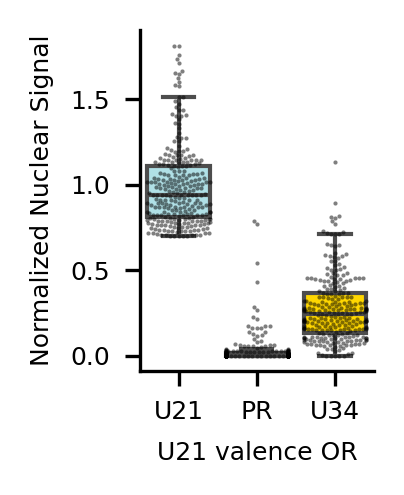

In [36]:
valence_channel = "U21 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

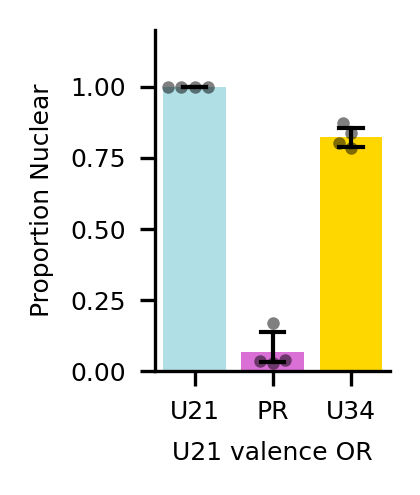

In [37]:
valence_channel = "U21 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors = ['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

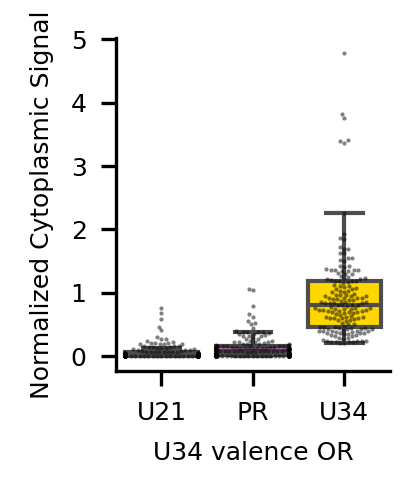

In [38]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

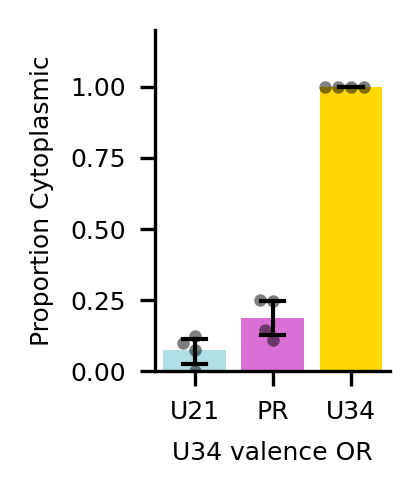

In [39]:
valence_channel = "U34 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors =['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

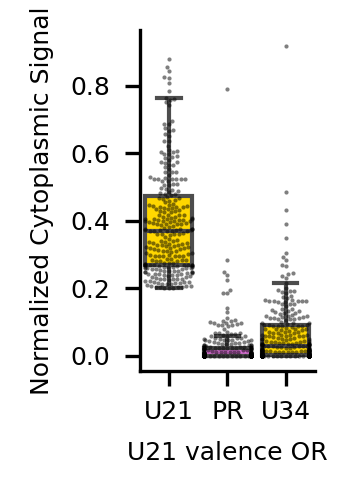

In [40]:
valence_channel = "U21 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.25, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['gold', 'orchid', 'gold'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

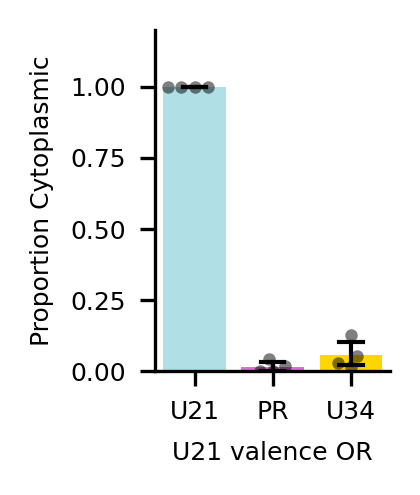

In [41]:
valence_channel = "U21 valence OR"
channels_to_plot = ["U21", "PR", "U34"]
plot_colors =['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

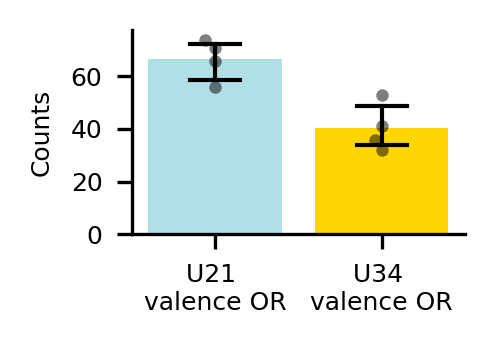

In [42]:
# Plot the number of cells 
valence_ORs = ["U34 valence OR", "U21 valence OR"]
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts = valence_counts[valence_counts["valence_OR_name"].isin(valence_ORs)]
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=['powderblue', 'gold'], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [43]:
file_number = 0 
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi/20250325 4 t19 lncrna sample 4 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 30779.721115112305, 26878.52767944336), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 80, 4, 2048, 2048)
Loaded ../results/20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi/20250325 4 t19 lncrna sample 4 great_rois.npy


Loaded ../results/20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi/20250325 4 t19 lncrna sample 4 great_cell_borders.npy


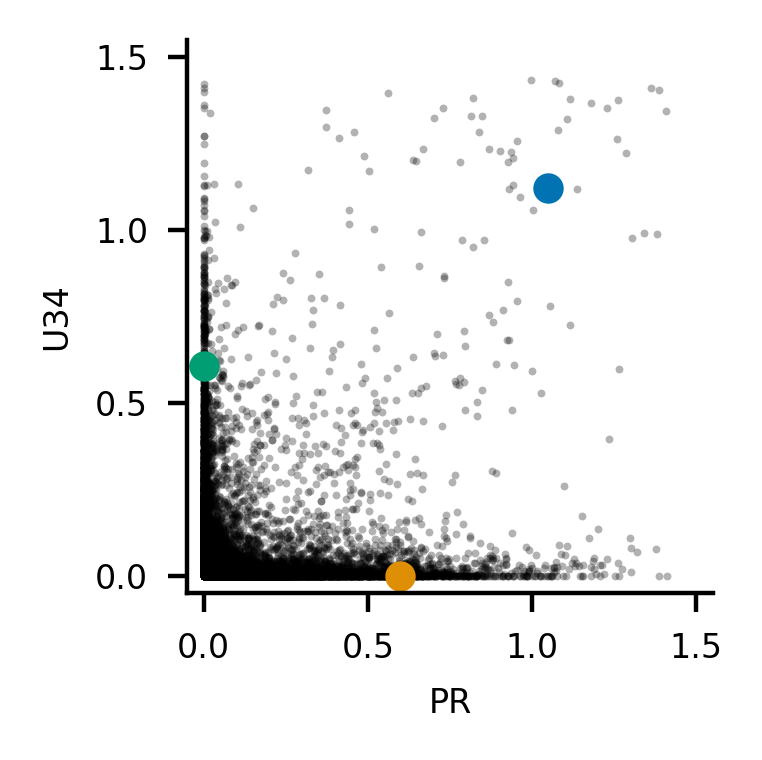

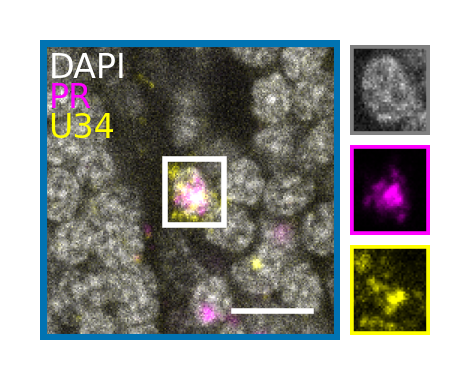

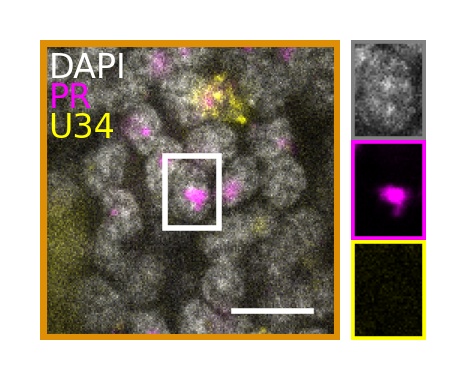

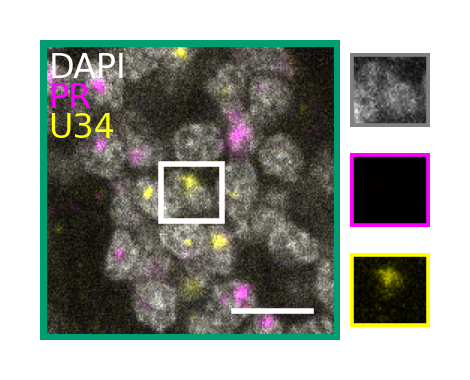

In [44]:
# u34-b3-488 lnc4-b1-546 u21-b5-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF488-nuc-norm", 
                c1_name="PR", c2_name="U34",
                c1_color="magenta", c2_color="yellow",
                coordinates=[[1, 1], [0.6, 0], [0, 0.6]],
                dapi_max=200, c1_max=200, c2_max=150)

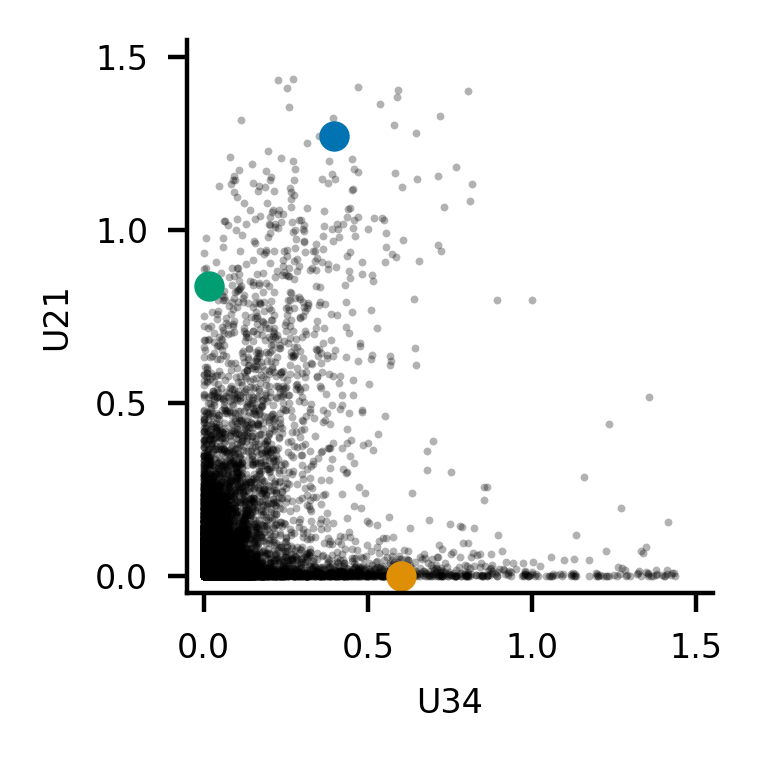

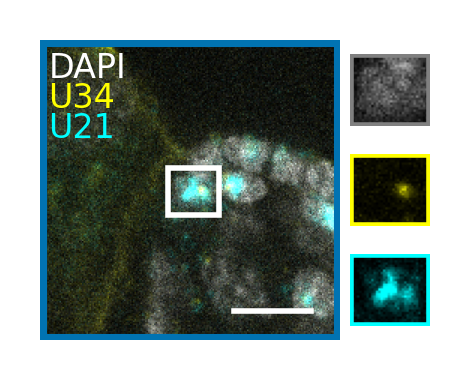

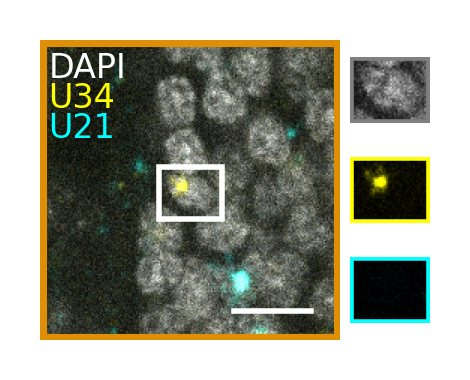

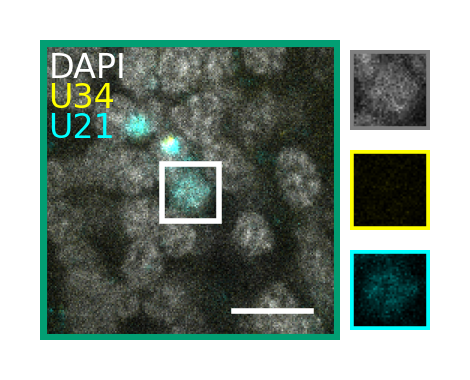

In [45]:
# u34-b3-488 lnc4-b1-546 u21-b5-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF488-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="U34", c2_name="U21",
                c1_color="yellow", c2_color="cyan",
                coordinates=[[0.5, 1.5], [0.6, 0], [0, 0.8]],
                dapi_max=200, c1_max=200, c2_max=150)

## L16 & PR

In [152]:
input = 'L16'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI as input directory


In [153]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [154]:
channels = ['AF594', 'AF647']
channel_names = ["L16", "PR"]
channel_colors = ["yellow", "magenta"]
channel_maxs = [255, 255]

In [156]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)

manual_cytoplasmic_channels = results['cytoplasmic'].value_counts().index.tolist()
for channel in manual_cytoplasmic_channels: 
    num_cells = results[results['cytoplasmic'] == channel].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation: {num_cells}")
    num_cells_with_valence_OR = results[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'])].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation and valence OR annotation: {num_cells_with_valence_OR}")
    nuc_norm = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-nuc-norm"].mean()
    print(f"Missing cells mean {channel} nucleus normalized signal: {nuc_norm:.2f}")
    rel_cyto = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-cyto-norm"].mean()
    print(f"Missing cells mean {channel} cytoplasmic normalized signal: {rel_cyto:.2f}")


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF594 cytoplasmic annotation: 267
Number of cells with AF594 cytoplasmic annotation and valence OR annotation: 131
Missing cells mean AF594 nucleus normalized signal: 0.51
Missing cells mean AF594 cytoplasmic normalized signal: 0.42


,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250328 3 L16lnc sample 4.czi,17,44,238,635.0,AF594,0.500997,AF594,0.904739,L16,L16 valence OR
1,20250328 3 L16lnc sample 4.czi,17,60,272,669.0,AF594,0.420756,AF594,0.721947,L16,L16 valence OR
2,20250328 3 L16lnc sample 4.czi,45,355,145,316.0,AF594,0.663335,AF594,0.749285,L16,L16 valence OR
3,20250328 3 L16lnc sample 4.czi,46,388,228,477.0,AF594,0.611356,AF594,0.751703,L16,L16 valence OR
4,20250328 3 L16lnc sample 4.czi,47,297,225,446.0,AF594,1.008477,AF594,0.817358,L16,L16 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
247,20250328 3 L16lnc sample 1.czi,71,183,213,417.0,AF647,0.592784,AF647,0.796603,PR,PR valence OR
248,20250328 3 L16lnc sample 1.czi,72,134,220,540.0,AF647,0.578674,AF647,1.890453,PR,PR valence OR
249,20250328 3 L16lnc sample 1.czi,73,125,268,751.0,AF647,0.349817,AF647,0.769743,PR,PR valence OR
250,20250328 3 L16lnc sample 1.czi,73,210,154,597.0,AF647,0.722991,AF647,1.021676,PR,PR valence OR


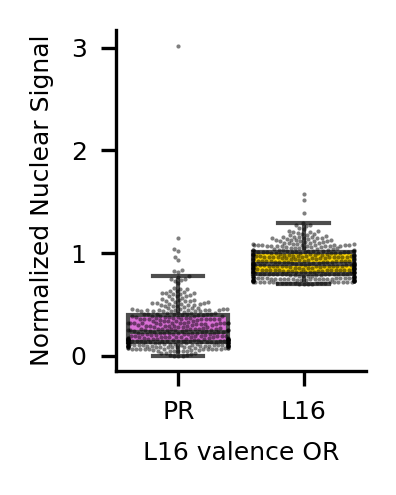

In [157]:
valence_channel = "L16 valence OR"
channels_to_plot = ["PR", "L16"]
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=['orchid', 'gold'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-mean-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

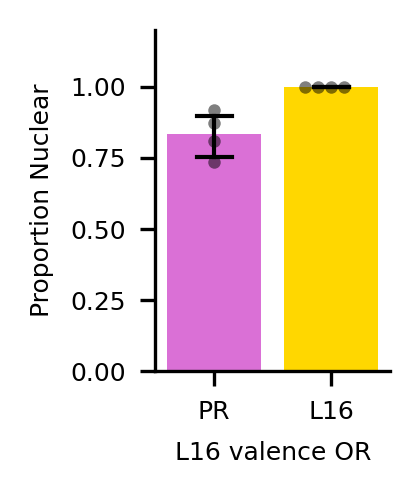

In [158]:
valence_channel = "L16 valence OR"
channels_to_plot = ["PR", "L16"]
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=['orchid', 'gold'], order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

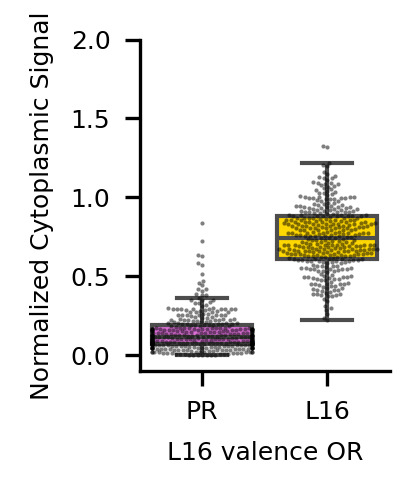

In [159]:
valence_channel = "L16 valence OR"
channels_to_plot = ["PR", "L16"]
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['orchid', 'gold'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 2)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

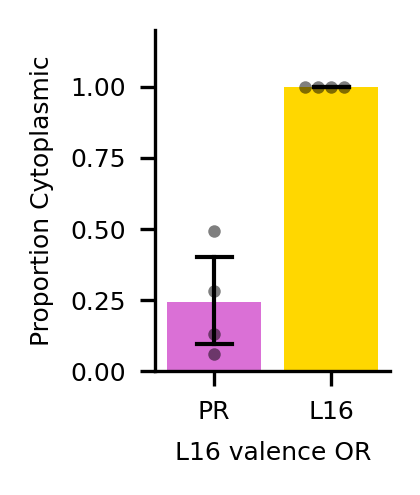

In [160]:
valence_channel = "L16 valence OR"
channels_to_plot = ["PR", "L16"]
plot_colors = ['orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

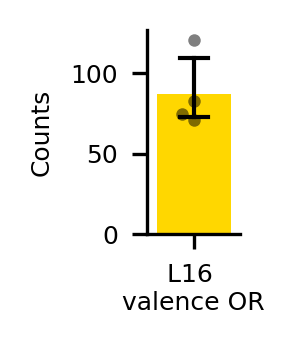

In [161]:
# Plot the number of cells 
valence_channel = "L16 \nvalence OR"
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 300) 
valence_counts_subset = valence_counts[valence_counts["valence_OR_name"] == valence_channel]
sns.barplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, palette=['gold'], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [162]:
valence_counts.loc[valence_counts['valence_OR_name'] == "L16 \nvalence OR"]['num_cells'].mean()

87.5

In [163]:
file_number = 2
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI/20250328 3 L16lnc sample 3.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF488-T1', 'AF647-T1', 'DAPI-T2', 'AF594-T2']}
Image shape: (1, 81, 4, 2048, 2048)
Loaded ../results/20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI/20250328 3 L16lnc sample 3_rois.npy
Loaded ../results/20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI/20250328 3 L16lnc sample 3_cell_borders.npy


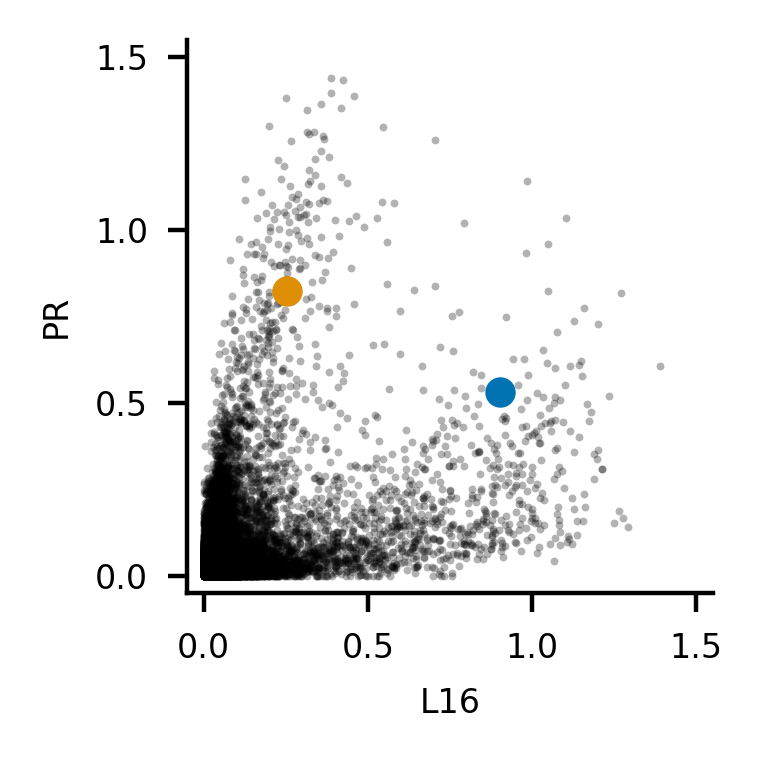

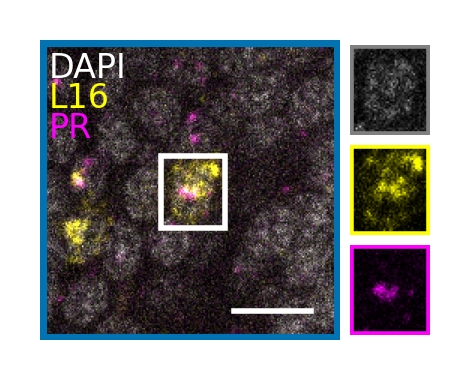

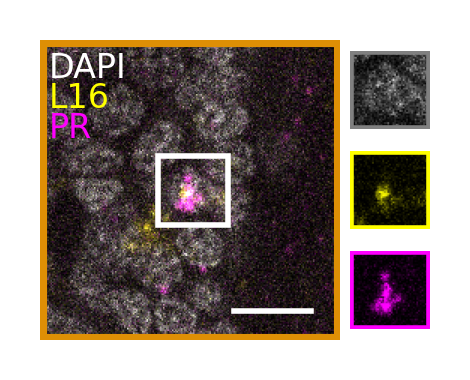

In [57]:
# Lnc3-b3-488 L16-b2-594 Lnc2-b5-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF594-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="L16", c2_name="PR",
                c1_color="yellow", c2_color="magenta",
                coordinates=[[0.9, 0.5], [0.25, 0.85]], bbox_expansion=7,
                dapi_max=100, c1_max=150, c2_max=100)

## G1

In [112]:
input = 'g1'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi as input directory


In [113]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [114]:
channels = ['AF546', 'AF647']
channel_names = ["G1", "LOC113562161"]
channel_colors = ["yellow", "magenta"]
channel_maxs = [255, 255]

In [115]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)

manual_cytoplasmic_channels = results['cytoplasmic'].value_counts().index.tolist()
for channel in manual_cytoplasmic_channels: 
    num_cells = results[results['cytoplasmic'] == channel].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation: {num_cells}")
    num_cells_with_valence_OR = results[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'])].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation and valence OR annotation: {num_cells_with_valence_OR}")
    nuc_norm = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-nuc-norm"].mean()
    print(f"Missing cells mean {channel} nucleus normalized signal: {nuc_norm:.2f}")
    rel_cyto = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-cyto-norm"].mean()
    print(f"Missing cells mean {channel} cytoplasmic normalized signal: {rel_cyto:.2f}")


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF546 cytoplasmic annotation: 61
Number of cells with AF546 cytoplasmic annotation and valence OR annotation: 42
Missing cells mean AF546 nucleus normalized signal: 1.12
Missing cells mean AF546 cytoplasmic normalized signal: 0.13


,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250325 5 G1 lncrna sample 4 great.czi,7,188,191,899.0,AF546,0.361131,AF546,0.826887,G1,G1 valence OR
1,20250325 5 G1 lncrna sample 4 great.czi,7,273,253,895.0,AF546,0.234534,AF546,1.377356,G1,G1 valence OR
2,20250325 5 G1 lncrna sample 4 great.czi,8,37,231,763.0,AF546,0.218620,AF546,1.362877,G1,G1 valence OR
3,20250325 5 G1 lncrna sample 4 great.czi,10,208,306,874.0,AF546,0.213896,AF546,1.126937,G1,G1 valence OR
4,20250325 5 G1 lncrna sample 4 great.czi,19,170,201,374.0,AF546,0.858041,AF546,0.901148,G1,G1 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
175,20250325 5 G1 lncrna sample 3 great.czi,66,142,264,802.0,AF647,0.521033,AF647,3.325529,LOC113562161,LOC113562161 valence OR
176,20250325 5 G1 lncrna sample 3 great.czi,66,274,315,906.0,AF647,0.439463,AF647,3.024624,LOC113562161,LOC113562161 valence OR
177,20250325 5 G1 lncrna sample 3 great.czi,67,126,264,669.0,AF647,0.824286,AF647,2.184043,LOC113562161,LOC113562161 valence OR
178,20250325 5 G1 lncrna sample 3 great.czi,67,256,245,534.0,AF647,1.087857,AF647,2.769336,LOC113562161,LOC113562161 valence OR


In [116]:
# Pearson correlation of AF546-nuc-norm and AF647-nuc-norm
from scipy.stats import pearsonr
r, p = pearsonr(results['AF546-nuc-norm'], results['AF647-nuc-norm'])
print(f"Pearson correlation coefficient: {r}, p-value: {p}")

Pearson correlation coefficient: 0.8762373723504546, p-value: 0.0


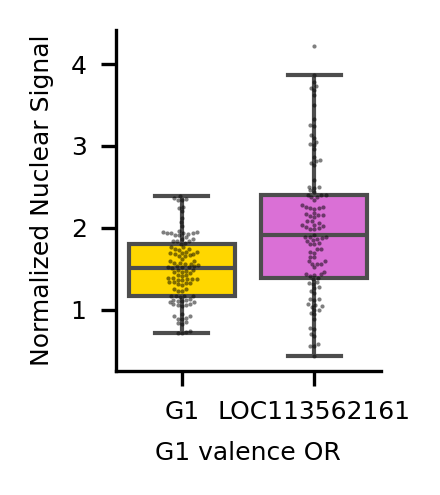

In [117]:
valence_channel = "G1 valence OR"
channels_to_plot = ["G1", "LOC113562161"]
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=['gold', 'orchid'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-mean-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

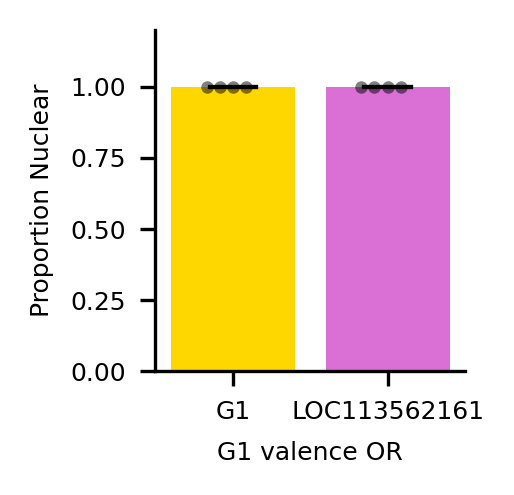

In [118]:
valence_channel = "G1 valence OR"
channels_to_plot = ["G1", "LOC113562161"]
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=['gold', 'orchid'], order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

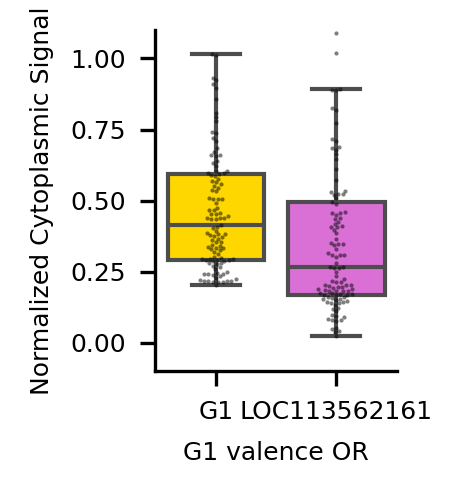

In [119]:
valence_channel = "G1 valence OR"
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel)]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['gold', 'orchid'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 1.1)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

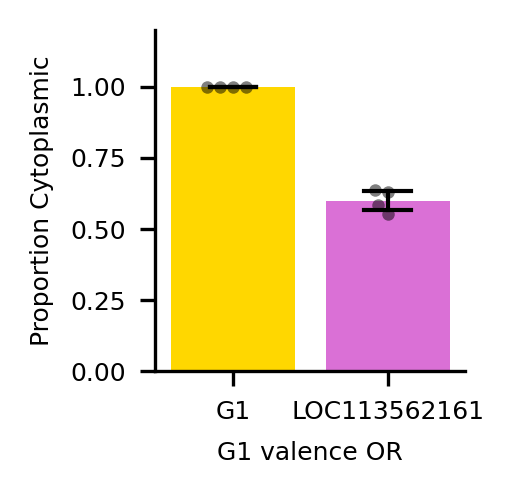

In [120]:
valence_channel = "G1 valence OR"
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel)]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=['gold', 'orchid'], order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

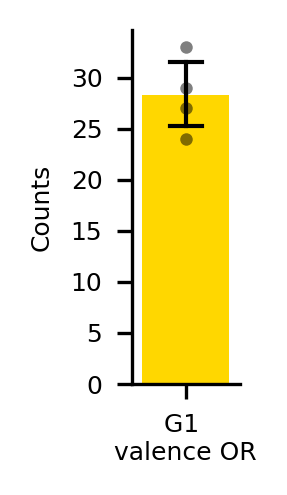

In [121]:
# Plot the number of cells 
valence_channel = "G1 \nvalence OR"
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1, 1.75), dpi = 300) 
valence_counts_subset = valence_counts[valence_counts["valence_OR_name"] == valence_channel]
sns.barplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, palette=['gold'], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [122]:
file_number = 0
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi/20250325 5 G1 lncrna sample 2 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 78, 3, 2048, 2048)
Loaded ../results/20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi/20250325 5 G1 lncrna sample 2 great_rois.npy
Loaded ../results/20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi/20250325 5 G1 lncrna sample 2 great_cell_borders.npy


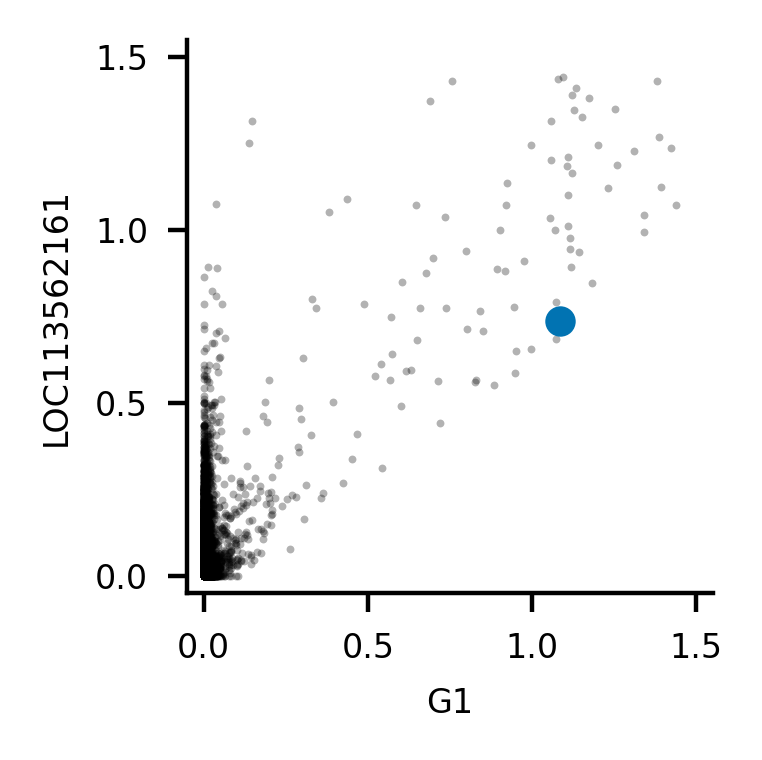

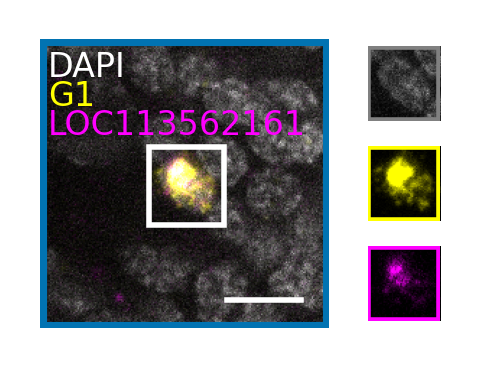

In [133]:
# g1-b1-546 lnc7-b2-647
plot_2_channels(results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="G1", c2_name="LOC113562161",
                c1_color="yellow", c2_color="magenta",
                coordinates=[[1.1, 0.8]], bbox_expansion=7,
                dapi_max=200, c1_max=100, c2_max=100)

## Q1, R2, PR

In [70]:
input = 'Q1'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI as input directory


In [71]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [72]:
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["R2-3", "Q1", "PR"]
channel_colors = ["cyan", "yellow", "magenta"]
channel_maxs = [255, 255, 255]

In [73]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)

manual_cytoplasmic_channels = results['cytoplasmic'].value_counts().index.tolist()
for channel in manual_cytoplasmic_channels: 
    num_cells = results[results['cytoplasmic'] == channel].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation: {num_cells}")
    num_cells_with_valence_OR = results[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'])].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation and valence OR annotation: {num_cells_with_valence_OR}")
    nuc_norm = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-nuc-norm"].mean()
    print(f"Missing cells mean {channel} nucleus normalized signal: {nuc_norm:.2f}")
    rel_cyto = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-cyto-norm"].mean()
    print(f"Missing cells mean {channel} cytoplasmic normalized signal: {rel_cyto:.2f}")


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF546 cytoplasmic annotation: 216
Number of cells with AF546 cytoplasmic annotation and valence OR annotation: 164
Missing cells mean AF546 nucleus normalized signal: 0.60
Missing cells mean AF546 cytoplasmic normalized signal: 0.60
Number of cells with AF488 cytoplasmic annotation: 176
Number of cells with AF488 cytoplasmic annotation and valence OR annotation: 138
Missing cells mean AF488 nucleus normalized signal: 0.58
Missing cells mean AF488 cytoplasmic normalized signal: 0.25


,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250328 2 Q1lnc sample 2.czi,2,1,189,211.0,AF488,1.729058,AF488,0.834798,R2-3,R2-3 valence OR
1,20250328 2 Q1lnc sample 2.czi,15,99,195,708.0,AF488,0.273541,AF488,0.922558,R2-3,R2-3 valence OR
2,20250328 2 Q1lnc sample 2.czi,16,144,234,637.0,AF488,0.227639,AF488,0.792356,R2-3,R2-3 valence OR
3,20250328 2 Q1lnc sample 2.czi,19,47,221,496.0,AF488,0.391316,AF488,0.939186,R2-3,R2-3 valence OR
4,20250328 2 Q1lnc sample 2.czi,19,184,177,591.0,AF488,0.375566,AF488,0.751080,R2-3,R2-3 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
580,20250328 2 Q1lnc sample 4.czi,88,227,124,528.0,AF647,1.147418,AF647,1.566045,PR,PR valence OR
581,20250328 2 Q1lnc sample 4.czi,89,77,294,805.0,AF647,0.334002,AF647,2.111895,PR,PR valence OR
582,20250328 2 Q1lnc sample 4.czi,90,79,168,439.0,AF647,0.836492,AF647,2.040625,PR,PR valence OR
583,20250328 2 Q1lnc sample 4.czi,93,85,270,747.0,AF647,0.353115,AF647,2.220585,PR,PR valence OR


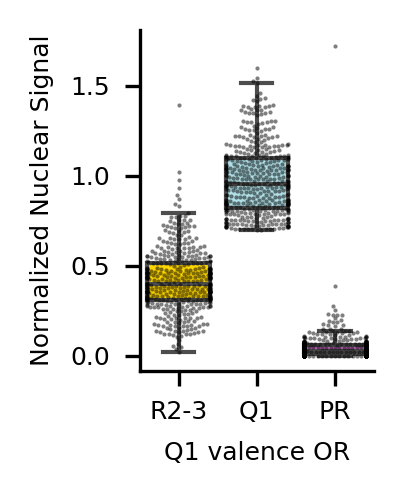

In [74]:
valence_channel = "Q1 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

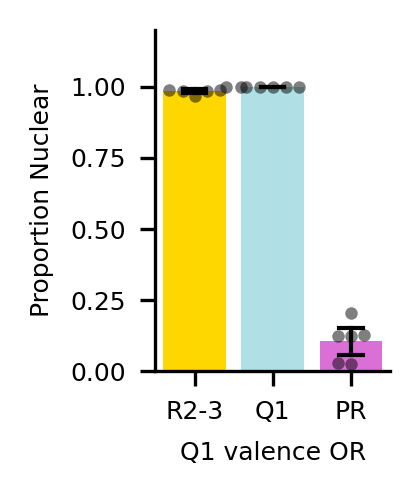

In [75]:
valence_channel = "Q1 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

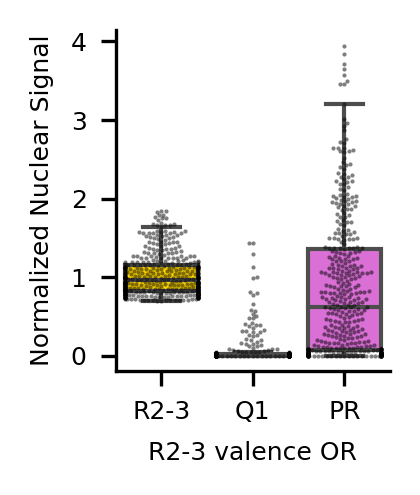

In [76]:
valence_channel = "R2-3 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

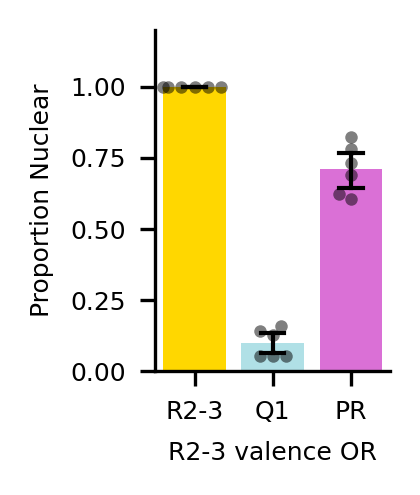

In [77]:
valence_channel = "R2-3 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

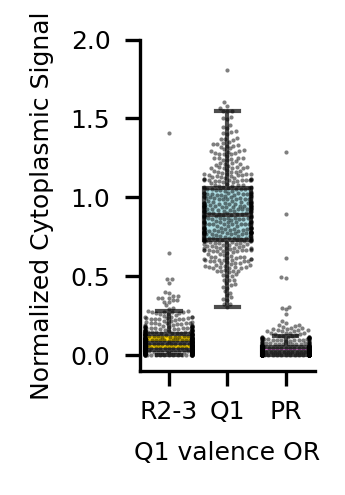

In [78]:
valence_channel = "Q1 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.25, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 2)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

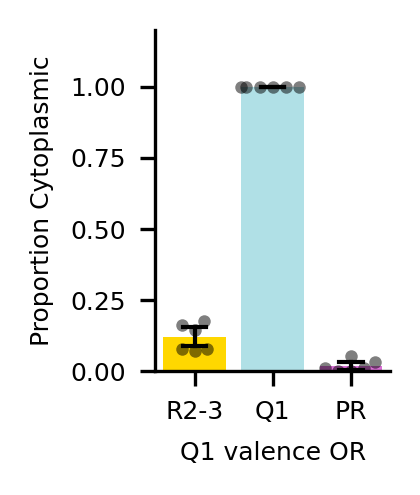

In [79]:
valence_channel = "Q1 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

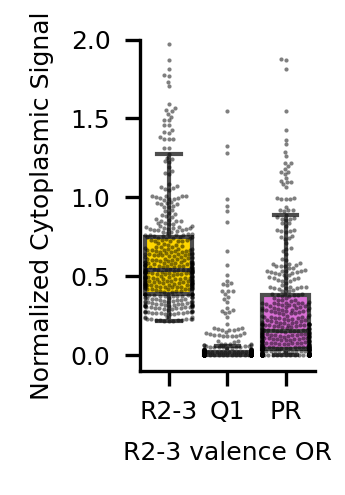

In [80]:
valence_channel = "R2-3 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.25, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 2)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-r2-cyto-pr-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

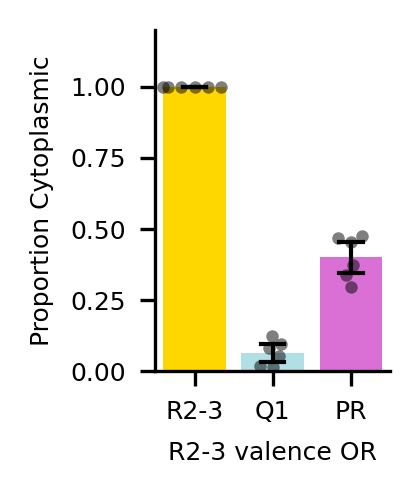

In [81]:
valence_channel = "R2-3 valence OR"
channels_to_plot = ["R2-3", "Q1", "PR"]
plot_colors = ['gold', 'powderblue', 'orchid']
cyto_norm_threshold = 0.2
coexpression_nuc_norm_threshold = 0.1
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

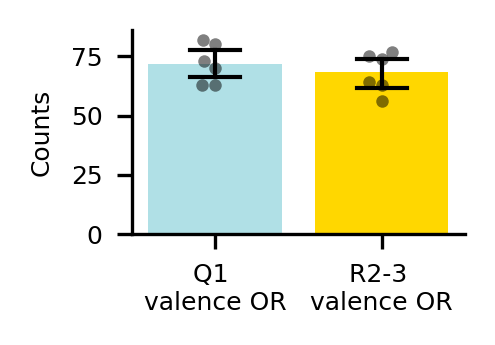

In [82]:
# Plot the number of cells 
valence_ORs = ['R2-3 valence OR', 'Q1 valence OR']
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts = valence_counts[valence_counts['valence_OR_name'].isin(valence_ORs)]
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=['powderblue', 'gold'], saturation=1, order=['Q1 \nvalence OR', 'R2-3 \nvalence OR'],
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [83]:
file_number = 0 
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI/20250328 2 Q1lnc sample 6.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 103, 4, 2048, 2048)
Loaded ../results/20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI/20250328 2 Q1lnc sample 6_rois.npy
Loaded ../results/20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI/20250328 2 Q1lnc sample 6_cell_borders.npy


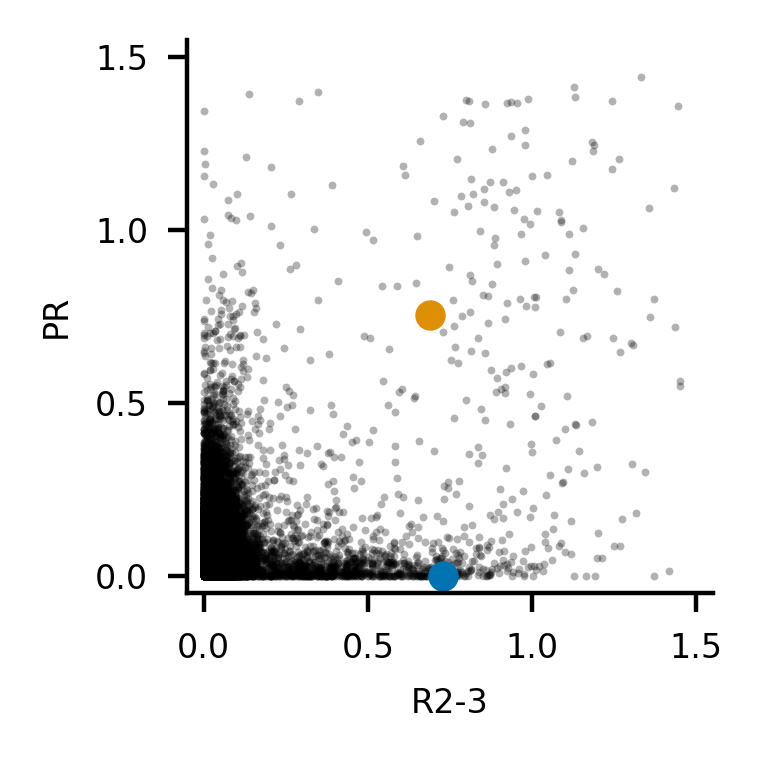

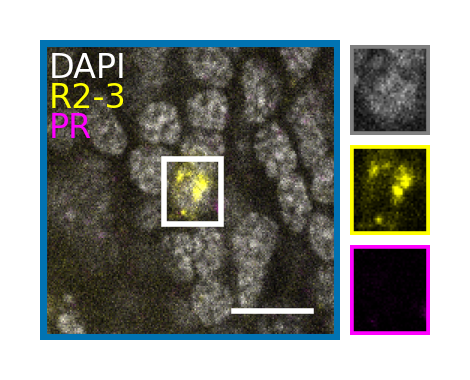

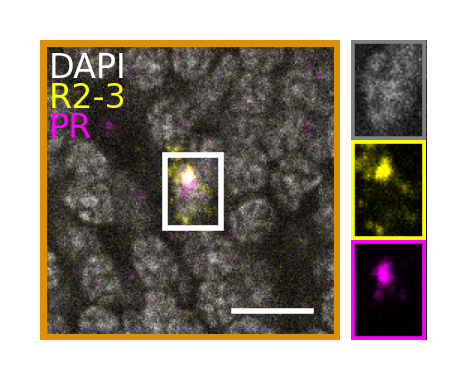

In [84]:
# R2-b3-488 Q1-b1-546 Lnc6-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF488-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="R2-3", c2_name="PR",
                c1_color="yellow", c2_color="magenta",
                coordinates=[[0.75, 0], [0.7, 0.8]],
                dapi_max=255, c1_max=200, c2_max=200)

## 9E198

In [134]:
input = '9e198'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi as input directory


In [135]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [136]:
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["9E198", "9E197", "9E196"]
channel_colors = ["magenta", "cyan", "yellow"]
channel_maxs = [255, 255, 255]

In [137]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)

manual_cytoplasmic_channels = results['cytoplasmic'].value_counts().index.tolist()
for channel in manual_cytoplasmic_channels: 
    num_cells = results[results['cytoplasmic'] == channel].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation: {num_cells}")
    num_cells_with_valence_OR = results[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'])].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation and valence OR annotation: {num_cells_with_valence_OR}")
    nuc_norm = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-nuc-norm"].mean()
    print(f"Missing cells mean {channel} nucleus normalized signal: {nuc_norm:.2f}")
    rel_cyto = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-cyto-norm"].mean()
    print(f"Missing cells mean {channel} cytoplasmic normalized signal: {rel_cyto:.2f}")


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF647 cytoplasmic annotation: 81
Number of cells with AF647 cytoplasmic annotation and valence OR annotation: 76
Missing cells mean AF647 nucleus normalized signal: 0.64
Missing cells mean AF647 cytoplasmic normalized signal: 0.28
Number of cells with AF546 cytoplasmic annotation: 47
Number of cells with AF546 cytoplasmic annotation and valence OR annotation: 46
Missing cells mean AF546 nucleus normalized signal: 1.11
Missing cells mean AF546 cytoplasmic normalized signal: 0.20
Number of cells with AF488 cytoplasmic annotation: 44
Number of cells with AF488 cytoplasmic annotation and valence OR annotation: 38
Missing cells mean AF488 nucleus normalized signal: 0.85
Missing cells mean AF488 cytoplasmic normalized signal: 0.27


,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250325 5 t35 sample 4 great.czi,20,209,159,604.0,AF488,0.254170,AF488,0.744836,9E198,9E198 valence OR
1,20250325 5 t35 sample 4 great.czi,23,296,187,540.0,AF488,0.702128,AF488,0.798063,9E198,9E198 valence OR
2,20250325 5 t35 sample 4 great.czi,24,328,315,912.0,AF488,0.329281,AF488,1.021218,9E198,9E198 valence OR
3,20250325 5 t35 sample 4 great.czi,35,423,254,769.0,AF488,0.503720,AF488,0.919154,9E198,9E198 valence OR
4,20250325 5 t35 sample 4 great.czi,36,186,262,837.0,AF488,0.297382,AF488,0.819126,9E198,9E198 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
556,20250325 5 t35 sample 1 great.czi,56,99,197,752.0,AF647,0.461437,AF647,1.191049,9E196,9E196 valence OR
557,20250325 5 t35 sample 1 great.czi,57,93,197,430.0,AF647,0.631103,AF647,1.420140,9E196,9E196 valence OR
558,20250325 5 t35 sample 1 great.czi,57,196,126,475.0,AF647,0.813722,AF647,1.322363,9E196,9E196 valence OR
559,20250325 5 t35 sample 1 great.czi,58,197,145,696.0,AF647,0.582592,AF647,1.314177,9E196,9E196 valence OR


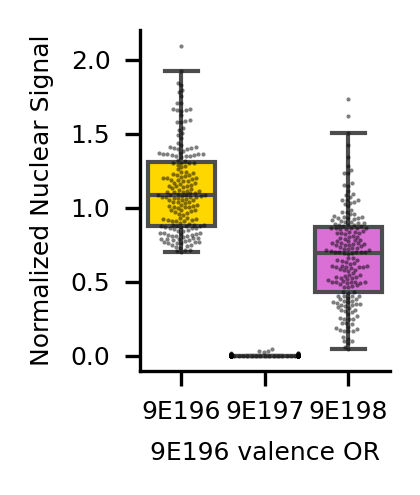

In [138]:
valence_channel = "9E196 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

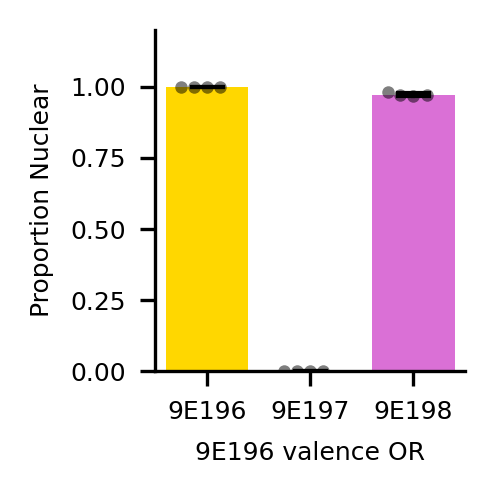

In [139]:
valence_channel = "9E196 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

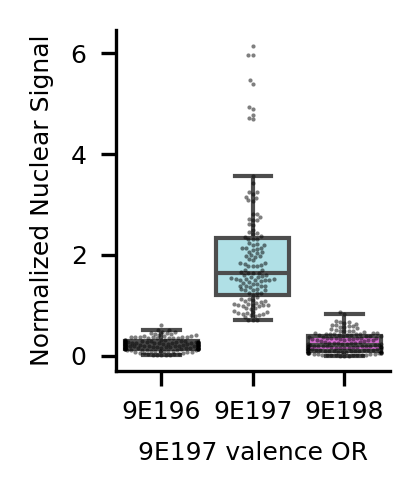

In [140]:
valence_channel = "9E197 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

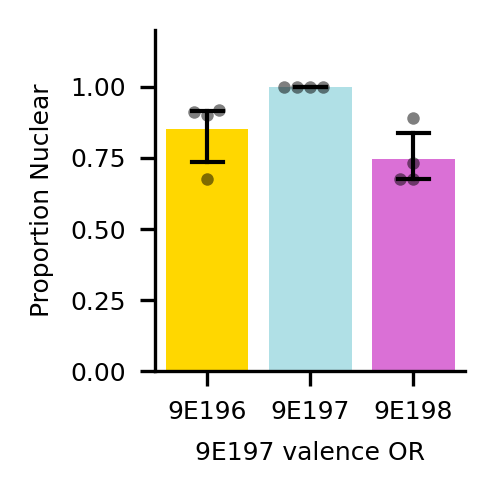

In [141]:
valence_channel = "9E197 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

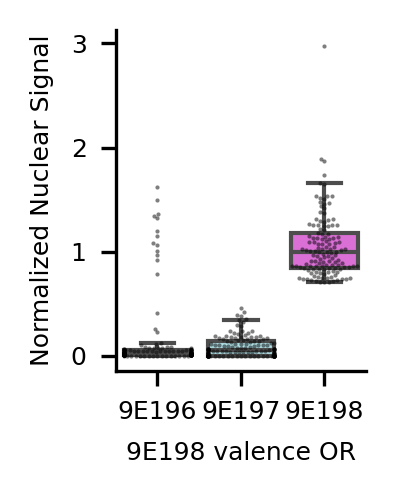

In [142]:
valence_channel = "9E198 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

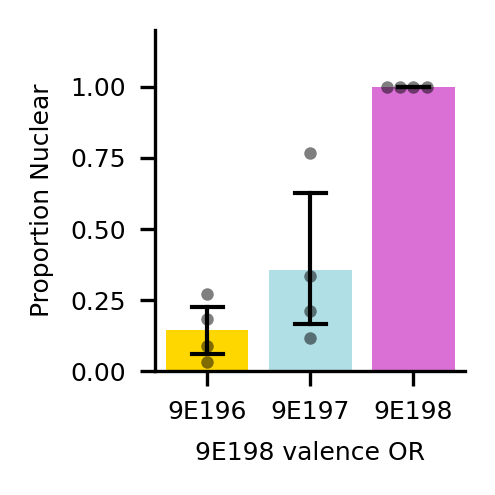

In [143]:
valence_channel = "9E198 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

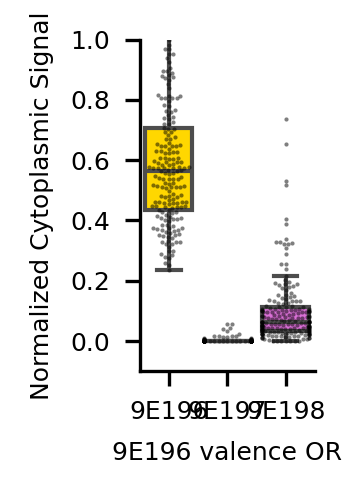

In [144]:
valence_channel = "9E196 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.25, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 1)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

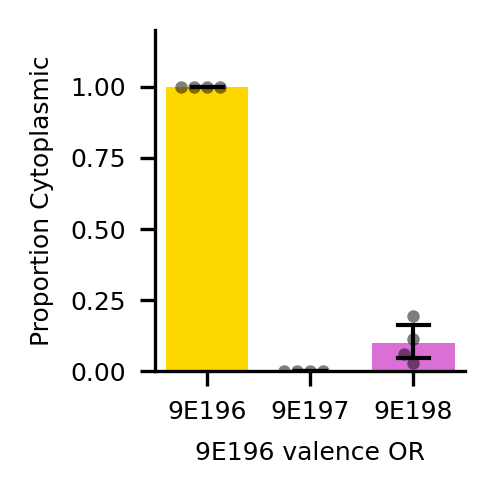

In [145]:
valence_channel = "9E196 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
cyto_norm_threshold = 0.2 
coexpression_nuc_norm_threshold = 0.1
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

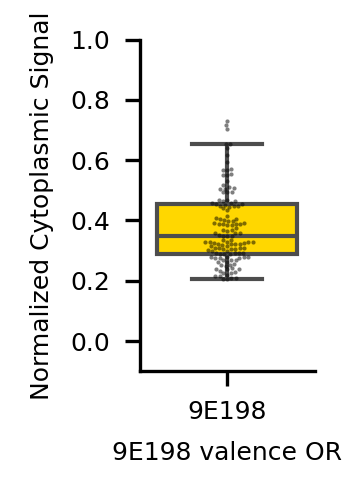

In [146]:
valence_channel = "9E198 valence OR"
channels_to_plot = ["9E198"]
f, ax = plt.subplots(1, 1, figsize=(1.25, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['gold'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 1)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

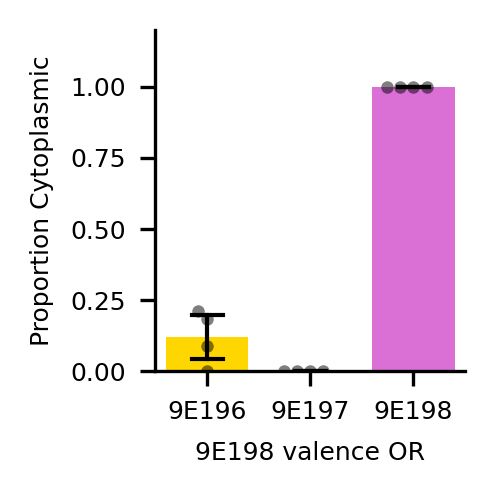

In [148]:
valence_channel = "9E198 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
cyto_norm_threshold = 0.2 
coexpression_nuc_norm_threshold = 0.1
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

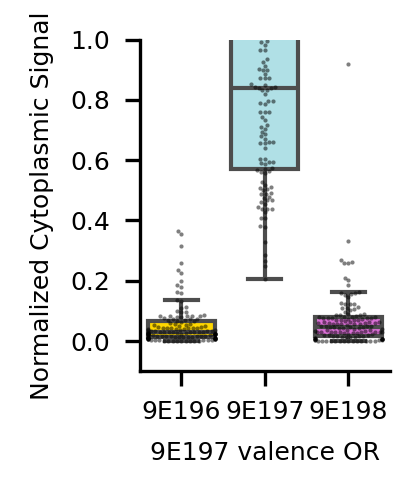

In [149]:
valence_channel = "9E197 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 1)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

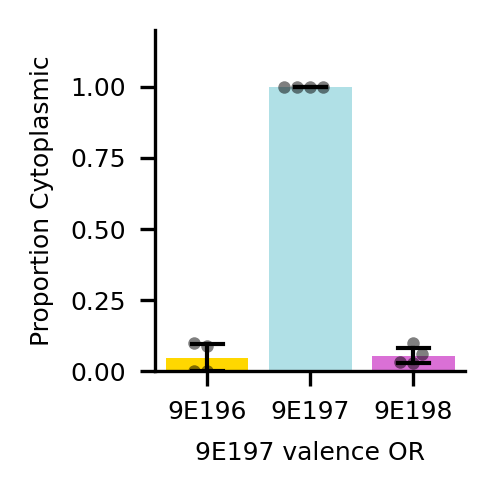

In [150]:
valence_channel = "9E197 valence OR"
channels_to_plot = ["9E196", "9E197", "9E198"]
plot_colors = ['gold', 'powderblue', 'orchid']
cyto_norm_threshold = 0.2 
coexpression_nuc_norm_threshold = 0.1
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

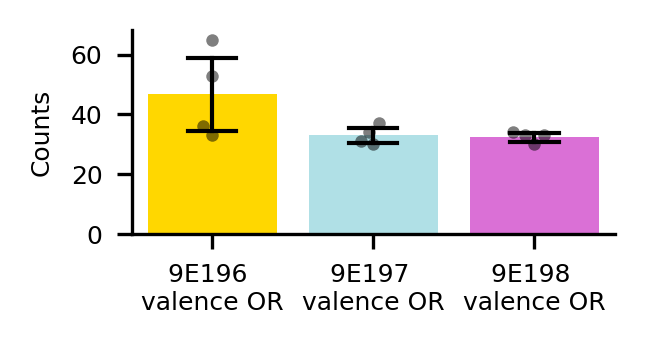

In [151]:
# Plot the number of cells 
plot_colors = ['gold', 'powderblue', 'orchid']
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(2.25, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=plot_colors, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [102]:
file_number = 0
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi/20250325 5 t35 sample 4 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 102, 4, 2048, 2048)
Loaded ../results/20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi/20250325 5 t35 sample 4 great_rois.npy
Loaded ../results/20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi/20250325 5 t35 sample 4 great_cell_borders.npy


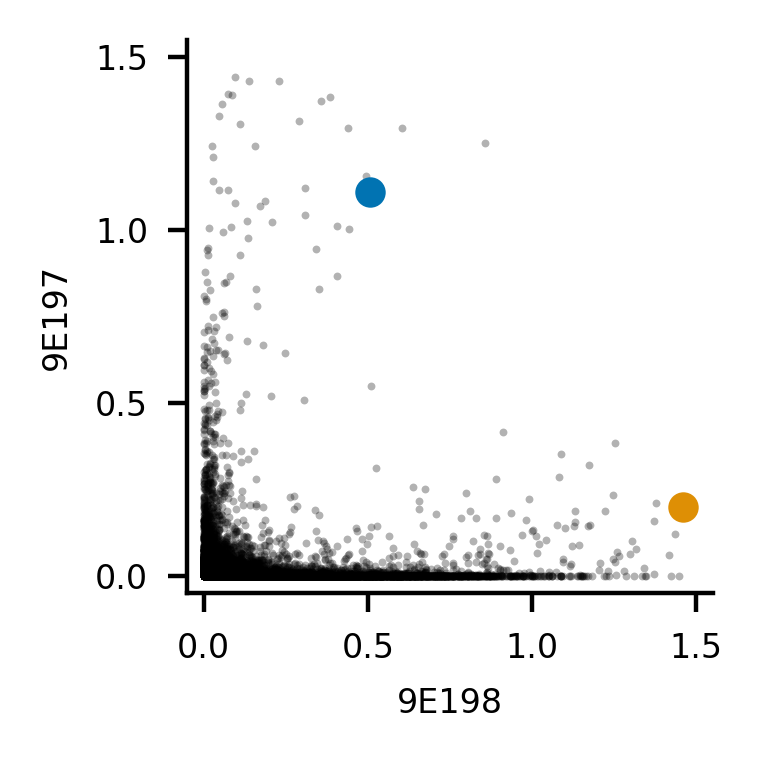

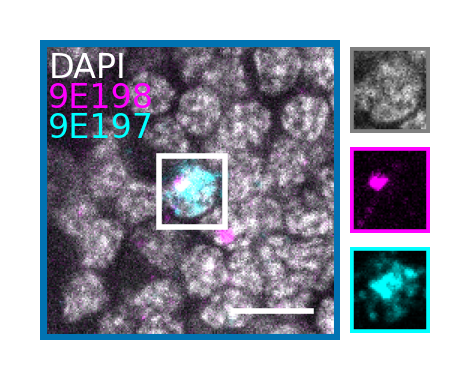

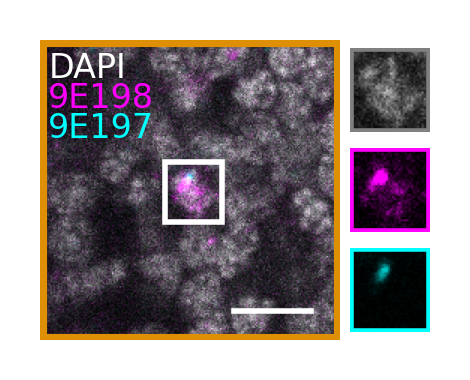

In [103]:
# 9e198-b3-488 9e197-b1-546 9e196-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF488-nuc-norm", c2="AF546-nuc-norm", 
                c1_name="9E198", c2_name="9E197",
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0.4, 1.2], [1.4, 0.3]],
                dapi_max=255, c1_max=100, c2_max=100)

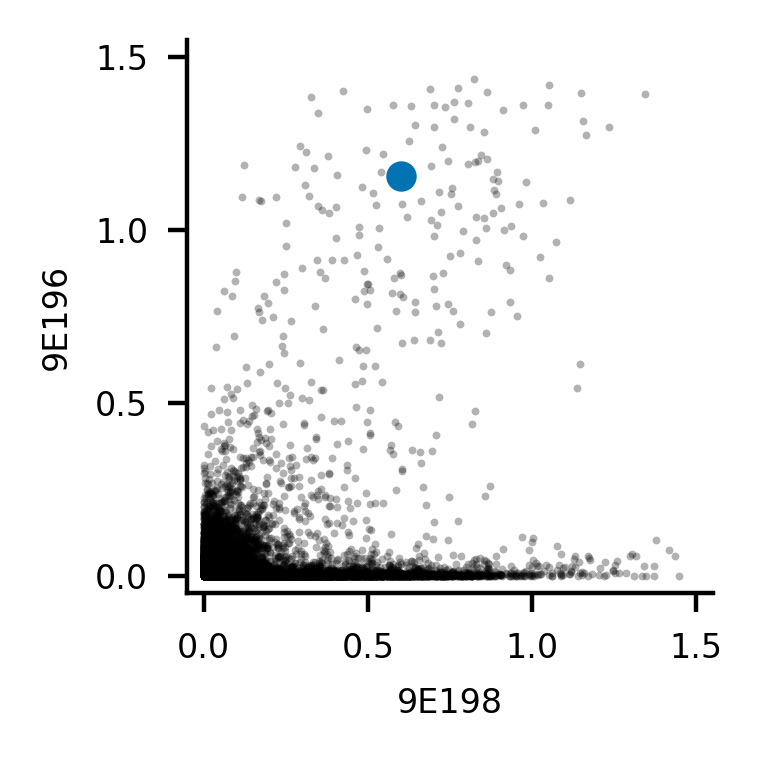

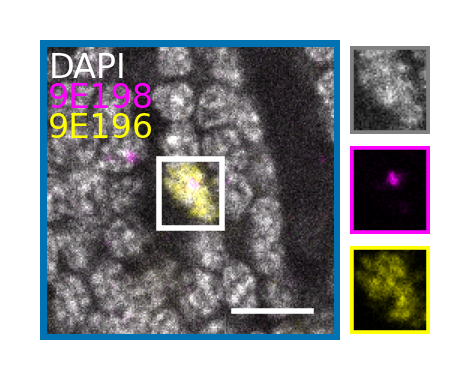

In [104]:
# 9e198-b3-488 9e197-b1-546 9e196-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF488-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="9E198", c2_name="9E196",
                c1_color="magenta", c2_color="yellow",
                coordinates=[[0.6, 1.2]],
                dapi_max=255, c1_max=255, c2_max=255)

## LOC104 & 9E129

In [5]:
input = '9E129'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi as input directory


In [6]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [7]:
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["9E129", "Kr-h1", "9E116"]
channel_colors = ["yellow", "magenta", "cyan"]
channel_maxs = [255, 255, 255]

In [8]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)

manual_cytoplasmic_channels = results['cytoplasmic'].value_counts().index.tolist()
for channel in manual_cytoplasmic_channels: 
    num_cells = results[results['cytoplasmic'] == channel].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation: {num_cells}")
    num_cells_with_valence_OR = results[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'])].shape[0]
    print(f"Number of cells with {channel} cytoplasmic annotation and valence OR annotation: {num_cells_with_valence_OR}")
    nuc_norm = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-nuc-norm"].mean()
    print(f"Missing cells mean {channel} nucleus normalized signal: {nuc_norm:.2f}")
    rel_cyto = results.loc[(results['cytoplasmic'] == channel) & (results[f'{channel}-cytoplasmic'] == False)][f"{channel}-cyto-norm"].mean()
    print(f"Missing cells mean {channel} cytoplasmic normalized signal: {rel_cyto:.2f}")


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF647 cytoplasmic annotation: 187
Number of cells with AF647 cytoplasmic annotation and valence OR annotation: 139
Missing cells mean AF647 nucleus normalized signal: 0.56
Missing cells mean AF647 cytoplasmic normalized signal: 0.42
Number of cells with AF488 cytoplasmic annotation: 108
Number of cells with AF488 cytoplasmic annotation and valence OR annotation: 77
Missing cells mean AF488 nucleus normalized signal: 0.71
Missing cells mean AF488 cytoplasmic normalized signal: 0.20


,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250328 4 KLF sample 4.czi,20,1,171,232.0,AF488,0.364066,AF488,0.987799,9E129,9E129 valence OR
1,20250328 4 KLF sample 4.czi,29,200,273,713.0,AF488,1.045835,AF488,1.402526,9E129,9E129 valence OR
2,20250328 4 KLF sample 4.czi,31,256,269,407.0,AF488,1.015625,AF488,2.666573,9E129,9E129 valence OR
3,20250328 4 KLF sample 4.czi,33,112,118,283.0,AF488,0.464293,AF488,0.770156,9E129,9E129 valence OR
4,20250328 4 KLF sample 4.czi,39,203,137,533.0,AF488,0.507869,AF488,1.148207,9E129,9E129 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
1015,20250328 4 KLF sample 1.czi,71,203,101,297.0,AF647,1.164292,AF647,0.999865,9E116,9E116 valence OR
1016,20250328 4 KLF sample 1.czi,72,119,197,717.0,AF647,1.297309,AF647,1.457664,9E116,9E116 valence OR
1017,20250328 4 KLF sample 1.czi,72,192,199,736.0,AF647,1.100720,AF647,1.277401,9E116,9E116 valence OR
1018,20250328 4 KLF sample 1.czi,73,120,184,455.0,AF647,0.970714,AF647,1.000318,9E116,9E116 valence OR


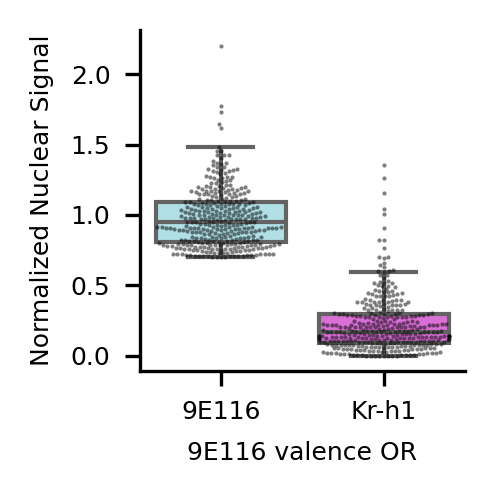

In [12]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "Kr-h1"]
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=['powderblue', 'orchid'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

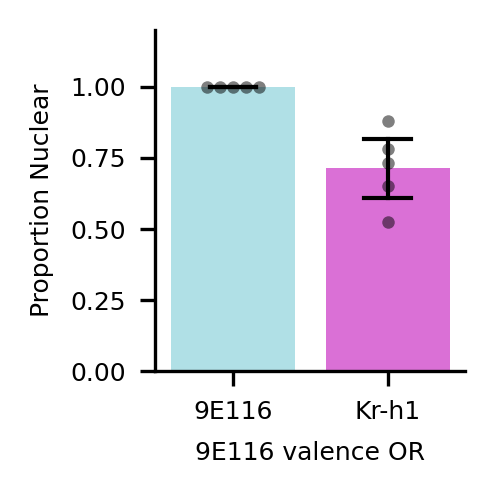

In [13]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "Kr-h1"]
plot_colors = ['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

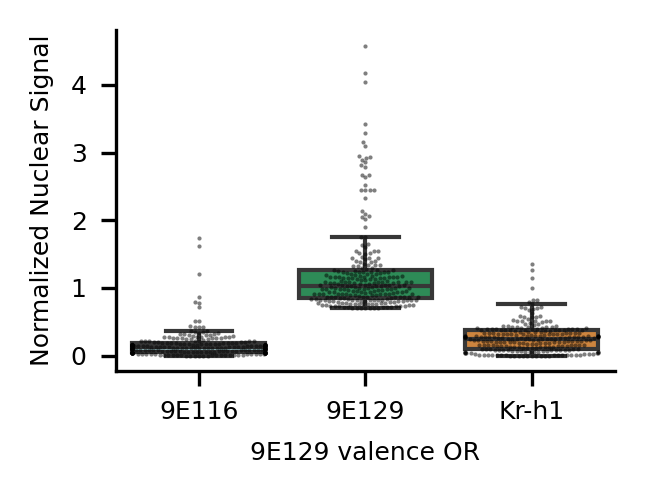

In [14]:
valence_channel = "9E129 valence OR"
channels_to_plot = ["9E116", "9E129", "Kr-h1"]
f, ax = plt.subplots(1, 1, figsize=(2.25, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=['powderblue', 'seagreen', 'peru'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

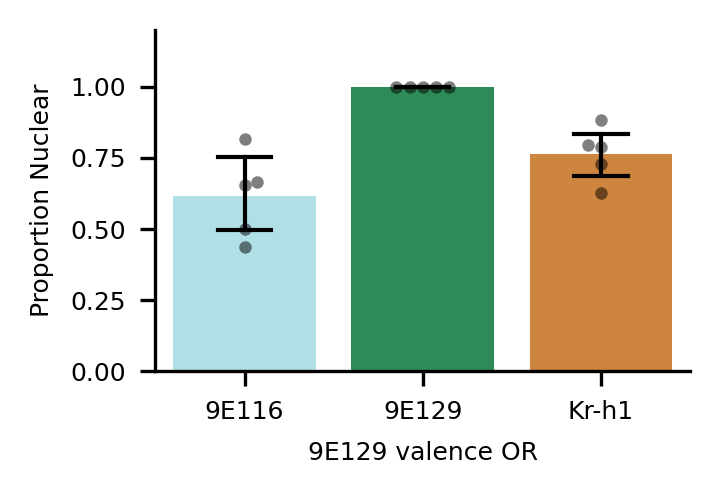

In [15]:
valence_channel = "9E129 valence OR"
channels_to_plot = ["9E116", "9E129", "Kr-h1"]
plot_colors = ['powderblue', 'seagreen', 'peru']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(2.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

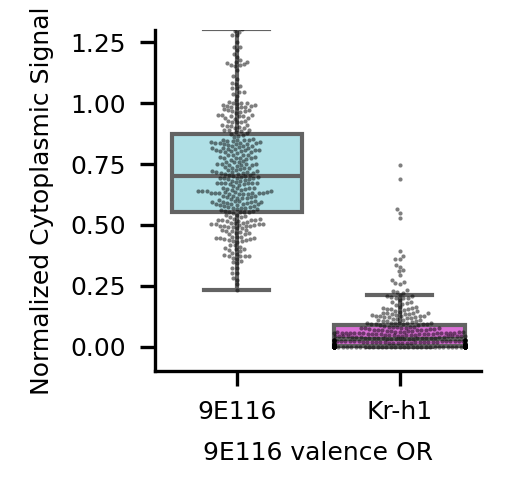

In [16]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "Kr-h1"]
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['powderblue', 'orchid'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 1.3)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-rel.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

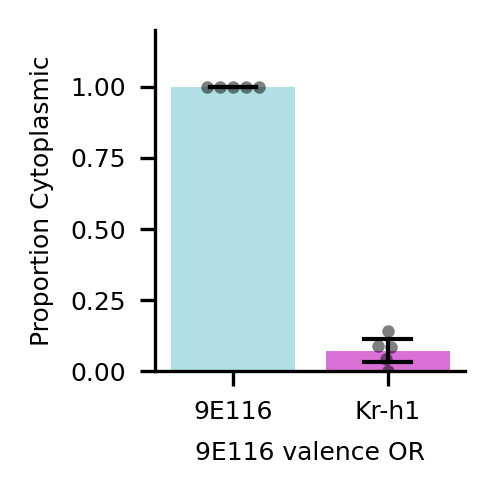

In [17]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "Kr-h1"]
plot_colors = ['powderblue', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

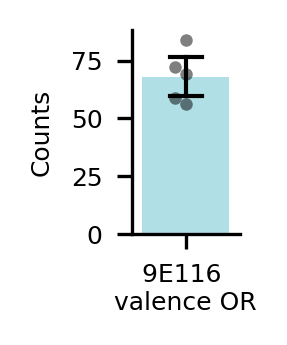

In [18]:
# Plot the number of cells 
valence_channel = "9E116 \nvalence OR"
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 300) 
valence_counts_subset = valence_counts[valence_counts["valence_OR_name"] == valence_channel]
sns.barplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, palette=['powderblue'], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [19]:
file_number = 0
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi/20250328 4 KLF sample 3.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 94, 4, 2048, 2048)
Loaded ../results/20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi/20250328 4 KLF sample 3_rois.npy
Loaded ../results/20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi/20250328 4 KLF sample 3_cell_borders.npy


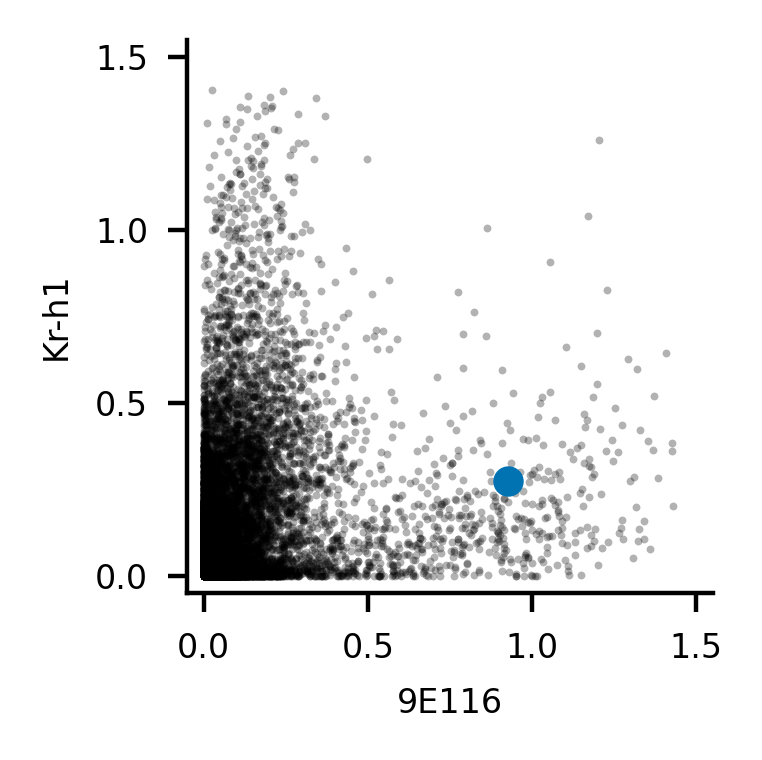

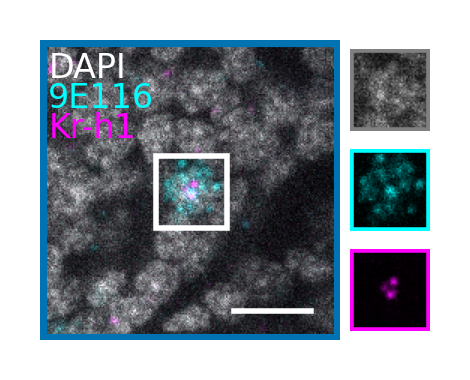

In [20]:
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF647-nuc-norm", c2="AF546-nuc-norm", 
                c1_name="9E116", c2_name="Kr-h1",
                c1_color="cyan", c2_color="magenta",
                coordinates=[[1, 0.3]], bbox_expansion=8, 
                dapi_max=255, c1_max=150, c2_max=150)

## LOC603 & 9E108

In [40]:
input = 'LOC603'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI as input directory


In [41]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [42]:
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["LOC105282603", "9E108", "9E116"]
channel_colors = ["yellow", "magenta", "cyan"]
channel_maxs = [255, 255, 255]

In [43]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        normalized = (nucleus_mean_signal - lower) / (upper - lower)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = normalized

In [44]:
# Get the relative cytoplasmic intensity 
for channel in channels: 
    results[f'{channel}-cyto-norm'] = results[f'{channel}-cyto-mean'] / (results[f'{channel}-nucleus-mean'])

In [45]:
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)
    print(f"Number of cells with {channel} cytoplasmic signal: {len(results[results[f'{channel}-cytoplasmic']])}")

results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

Number of cells with AF488 cytoplasmic signal: 338
Number of cells with AF546 cytoplasmic signal: 315
Number of cells with AF647 cytoplasmic signal: 432


,image,z,z_id,border_pxls,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250328 5 ZP sample 2.czi,1,1,161,AF488,0.319802,AF488,0.985280,LOC105282603,LOC105282603 valence OR
1,20250328 5 ZP sample 2.czi,41,459,196,AF488,1.332467,AF488,0.701199,LOC105282603,LOC105282603 valence OR
2,20250328 5 ZP sample 2.czi,43,114,152,AF488,0.206217,AF488,0.891697,LOC105282603,LOC105282603 valence OR
3,20250328 5 ZP sample 2.czi,43,441,193,AF488,0.660970,AF488,1.537913,LOC105282603,LOC105282603 valence OR
4,20250328 5 ZP sample 2.czi,44,462,199,AF488,0.571307,AF488,1.540378,LOC105282603,LOC105282603 valence OR
...,...,...,...,...,...,...,...,...,...,...
1291,20250328 5 ZP sample 4.czi,66,287,280,AF647,0.437556,AF647,0.794193,9E116,9E116 valence OR
1292,20250328 5 ZP sample 4.czi,67,100,181,AF647,0.970268,AF647,1.223492,9E116,9E116 valence OR
1293,20250328 5 ZP sample 4.czi,68,75,171,AF647,0.998753,AF647,1.158479,9E116,9E116 valence OR
1294,20250328 5 ZP sample 4.czi,69,65,164,AF647,1.109802,AF647,1.001290,9E116,9E116 valence OR


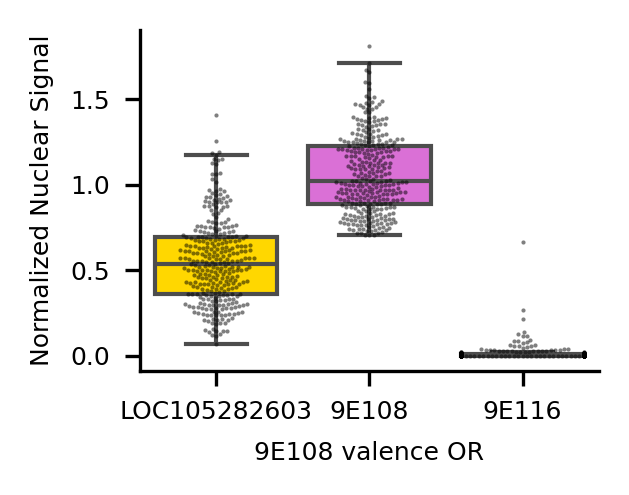

In [46]:
valence_channel = "9E108 valence OR"
channels_to_plot = ["LOC105282603", "9E108", "9E116"]
f, ax = plt.subplots(1, 1, figsize=(2.25, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=['gold', 'orchid', 'powderblue'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

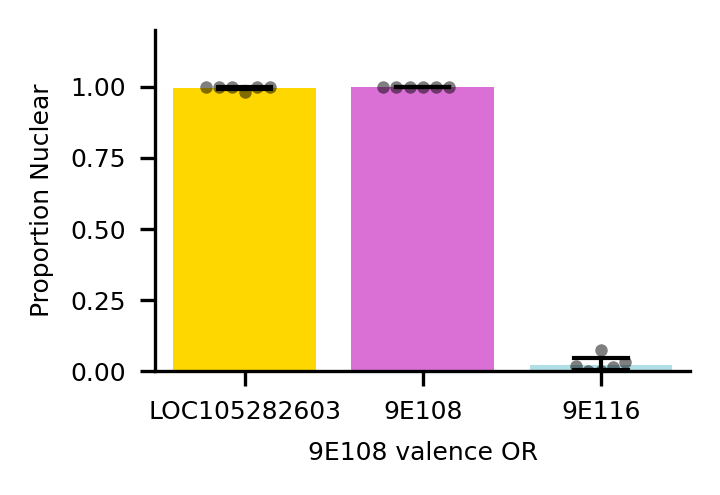

In [47]:
valence_channel = "9E108 valence OR"
channels_to_plot = ["LOC105282603", "9E108", "9E116"]
plot_colors = ['gold', 'orchid', 'powderblue']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(2.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

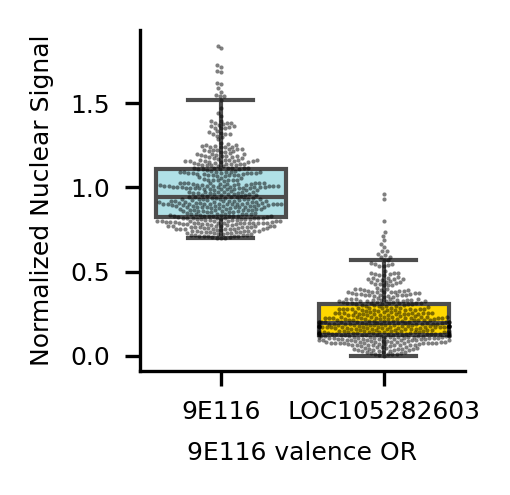

In [48]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "LOC105282603"]
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=['powderblue', 'gold', 'powderblue'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

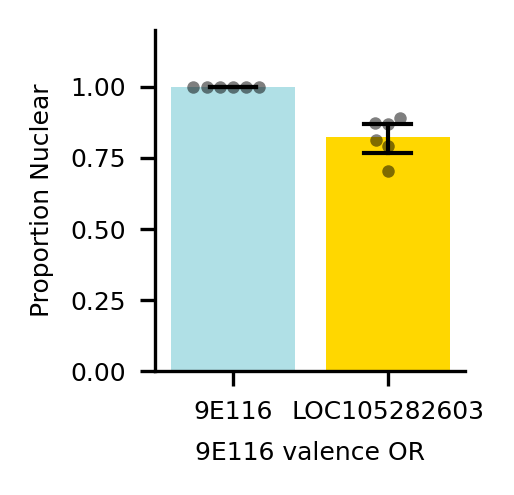

In [49]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "LOC105282603"]
plot_colors = ['powderblue', 'gold', 'powderblue']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

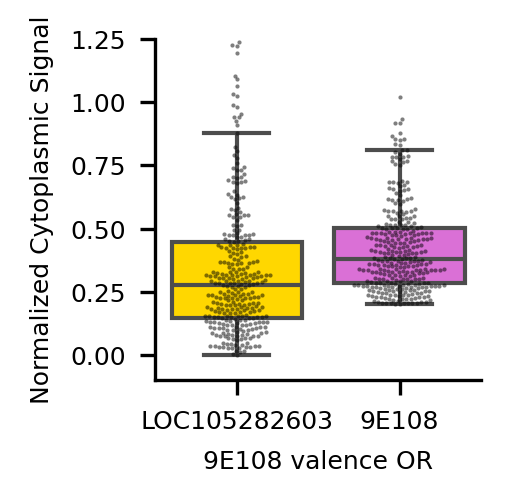

In [50]:
valence_channel = "9E108 valence OR"
channels_to_plot = ["LOC105282603", "9E108"]
f, ax = plt.subplots(1, 1, figsize=(1.75 , 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['gold', 'orchid'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 1.25)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

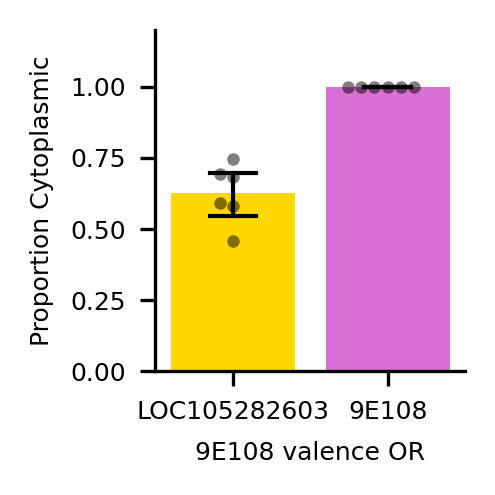

In [51]:
valence_channel = "9E108 valence OR"
channels_to_plot = ["LOC105282603", "9E108"]
plot_colors = ['gold', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

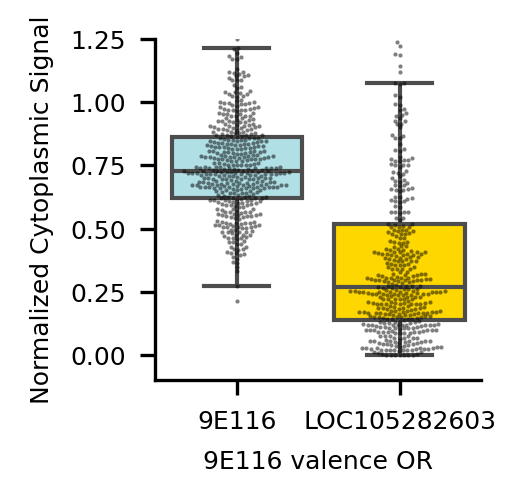

In [52]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "LOC105282603"]
f, ax = plt.subplots(1, 1, figsize=(1.75 , 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['powderblue', 'gold'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(-0.1, 1.25)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

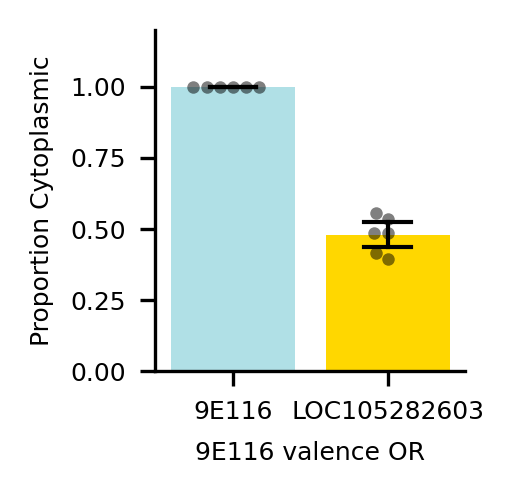

In [53]:
valence_channel = "9E116 valence OR"
channels_to_plot = ["9E116", "LOC105282603"]
plot_colors = ['powderblue', 'gold']
cyto_norm_threshold = 0.2 
coexpression_nuc_norm_threshold = 0.1
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

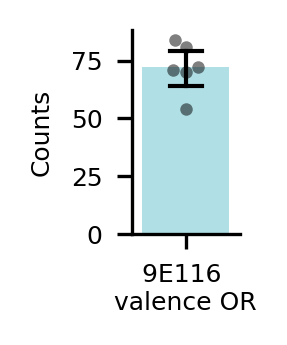

In [54]:
# Plot the number of cells 
valence_channel = "9E116 \nvalence OR"
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 300) 
valence_counts_subset = valence_counts[valence_counts["valence_OR_name"] == valence_channel]
sns.barplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, palette=['powderblue'], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts_subset, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [72]:
file_number = 1
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI/20250328 5 ZP sample 3.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 88, 4, 2048, 2048)
Loaded ../results/20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI/20250328 5 ZP sample 3_rois.npy
Loaded ../results/20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI/20250328 5 ZP sample 3_cell_borders.npy


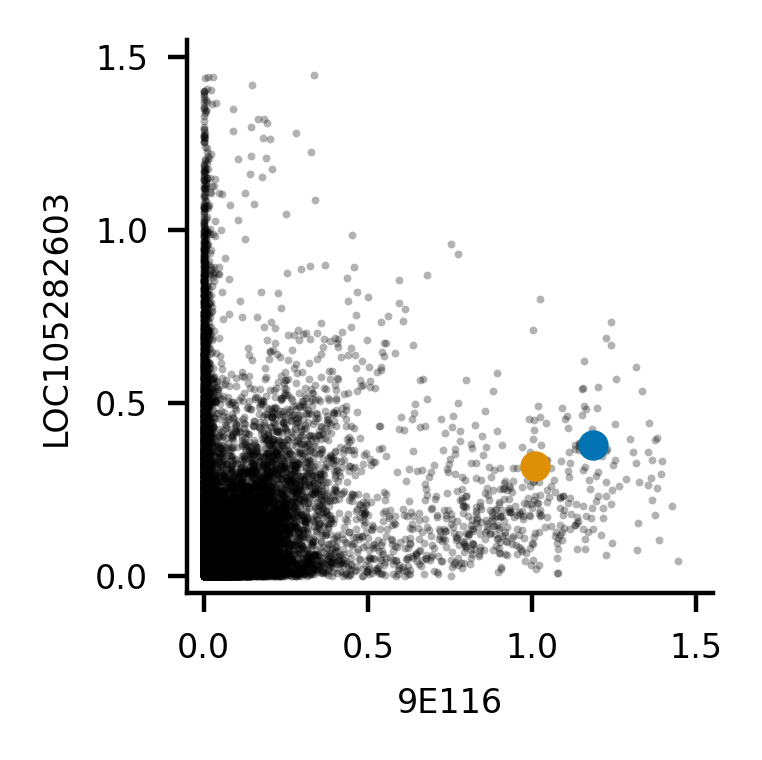

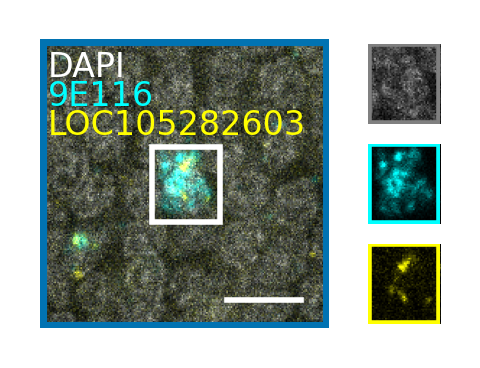

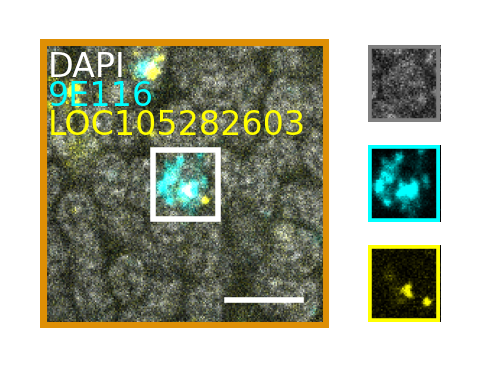

In [90]:
# LOC603-b3-488 9E108-b1-546 9E116-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF647-nuc-norm", c2="AF488-nuc-norm", 
                c1_name="9E116", c2_name="LOC105282603",
                c1_color="cyan", c2_color="yellow",
                coordinates=[[1.2, 0.4], [1, 0.3]], bbox_expansion=8, 
                dapi_max=150, c1_max=200, c2_max=100)

## 9E89 & 9E99

In [131]:
input = '9E89'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250508 P14 T 9E89-b1-546 9E99-B2-647 DAPI as input directory


In [132]:
# Remove rows where "BAD" is in image 
results = results[~results['image'].str.contains("BAD")].reset_index(drop=True)

In [133]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [134]:
channels = ['AF546', 'AF647']
channel_names = ["9E89", "9E99"]
channel_colors = ["yellow", "magenta"]
channel_maxs = [255, 255]

In [135]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250508 9e89 9e99 sample 4.czi,19,1,187,244.0,AF546,0.329911,AF546,0.731592,9E89,9E89 valence OR
1,20250508 9e89 9e99 sample 4.czi,40,76,258,592.0,AF546,0.889304,AF546,0.933050,9E89,9E89 valence OR
2,20250508 9e89 9e99 sample 4.czi,40,98,141,709.0,AF546,0.917809,AF546,1.583026,9E89,9E89 valence OR
3,20250508 9e89 9e99 sample 4.czi,41,67,205,793.0,AF546,1.064188,AF546,0.834640,9E89,9E89 valence OR
4,20250508 9e89 9e99 sample 4.czi,41,100,194,822.0,AF546,1.494620,AF546,0.856561,9E89,9E89 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
501,20250508 9e89 9e99 sample 2.czi,83,173,201,641.0,AF647,0.331138,AF647,1.323373,9E99,9E99 valence OR
502,20250508 9e89 9e99 sample 2.czi,84,78,130,514.0,AF647,0.326934,AF647,0.935739,9E99,9E99 valence OR
503,20250508 9e89 9e99 sample 2.czi,84,159,221,575.0,AF647,0.744260,AF647,1.470314,9E99,9E99 valence OR
504,20250508 9e89 9e99 sample 2.czi,84,163,168,458.0,AF647,1.767710,AF647,1.900158,9E99,9E99 valence OR


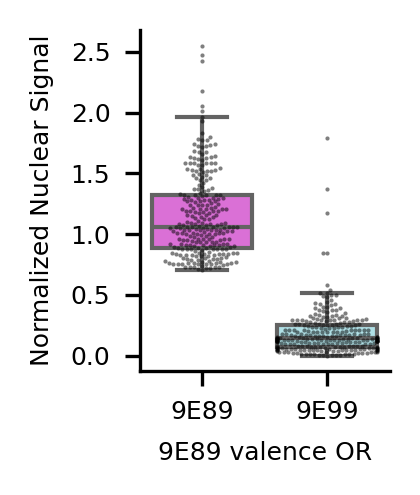

In [136]:
valence_channel = "9E89 valence OR"
channels_to_plot = ["9E89", "9E99"]
plot_colors = ['orchid', 'powderblue']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

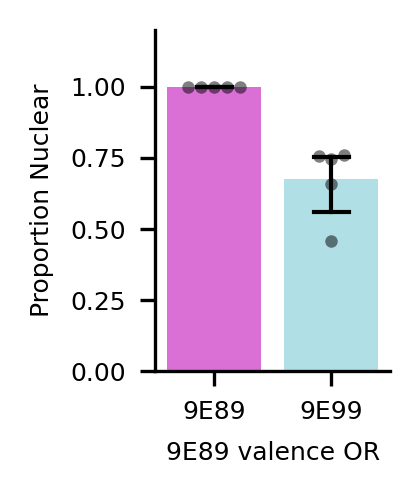

In [137]:
valence_channel = "9E89 valence OR"
channels_to_plot = ["9E89", "9E99"]
plot_colors = ['orchid', 'powderblue']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

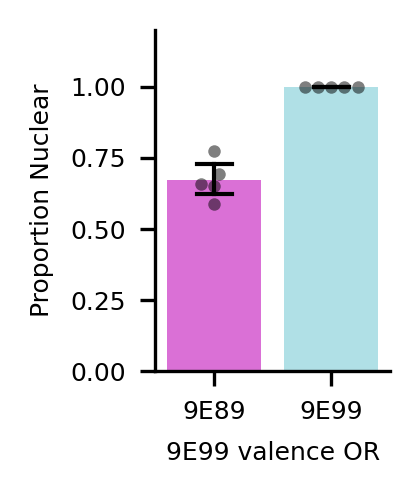

In [138]:
valence_channel = "9E99 valence OR"
channels_to_plot = ["9E89", "9E99"]
plot_colors = ['orchid', 'powderblue']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

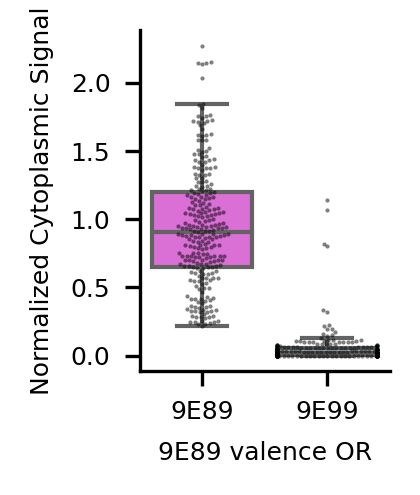

In [139]:
valence_channel = "9E89 valence OR"
channels_to_plot = ["9E89", "9E99"]
plot_colors = ['orchid', 'powderblue']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

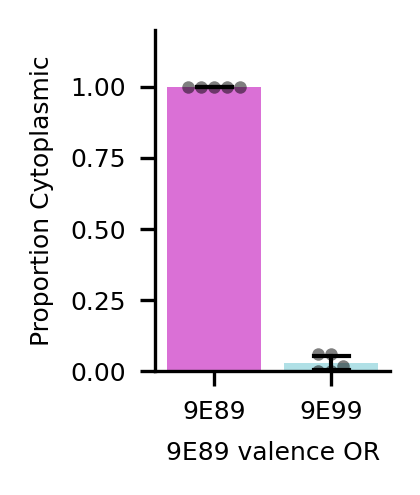

In [140]:
valence_channel = "9E89 valence OR"
channels_to_plot = ["9E89", "9E99"]
plot_colors = ['orchid', 'powderblue']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

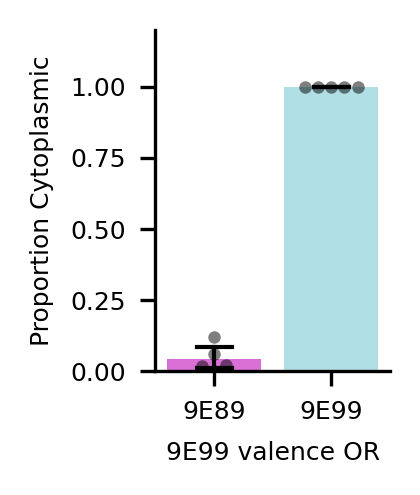

In [141]:
valence_channel = "9E99 valence OR"
channels_to_plot = ["9E89", "9E99"]
plot_colors = ['orchid', 'powderblue']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

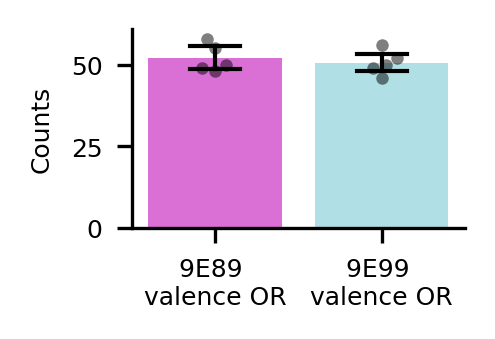

In [142]:
# Plot the number of cells 
valence_ORs = ['9E89 valence OR', '9E99 valence OR']
plot_colors = ['orchid', 'powderblue']
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts = valence_counts[valence_counts['valence_OR_name'].isin(valence_ORs)]
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=plot_colors, saturation=1, order=['9E89 \nvalence OR', '9E99 \nvalence OR'],
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [143]:
file_number = 1
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250508 P14 T 9E89-b1-546 9E99-B2-647 DAPI/20250508 9e89 9e99 sample 1.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 85, 3, 2048, 2048)
Loaded ../results/20250508 P14 T 9E89-b1-546 9E99-B2-647 DAPI/20250508 9e89 9e99 sample 1_rois.npy
Loaded ../results/20250508 P14 T 9E89-b1-546 9E99-B2-647 DAPI/20250508 9e89 9e99 sample 1_cell_borders.npy


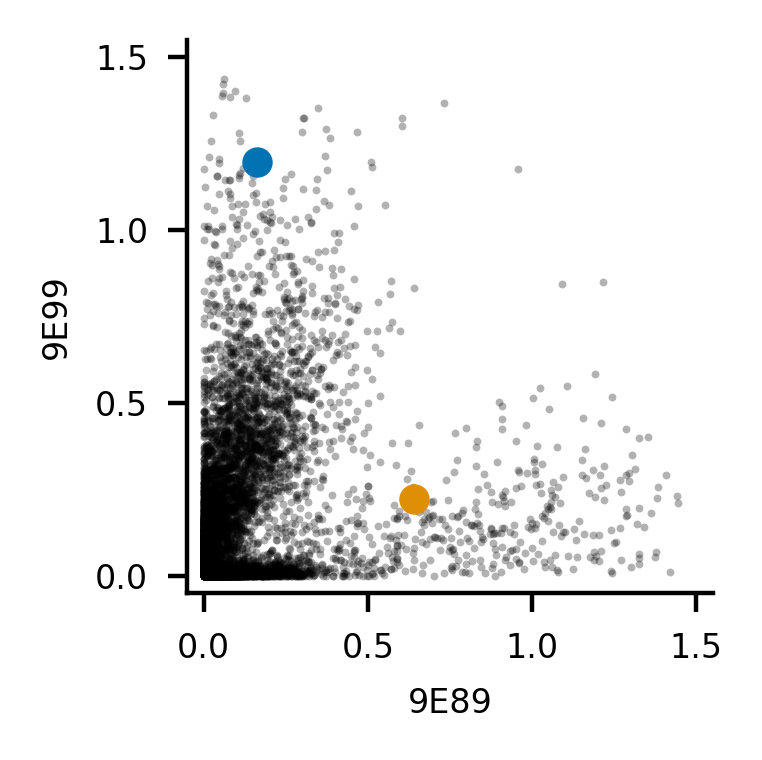

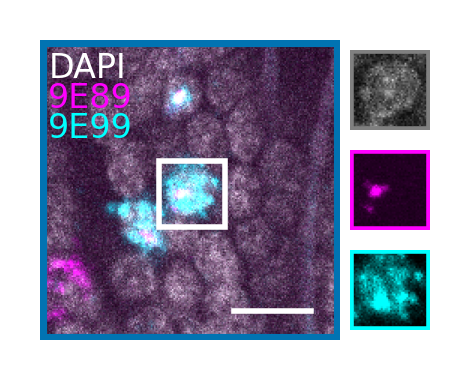

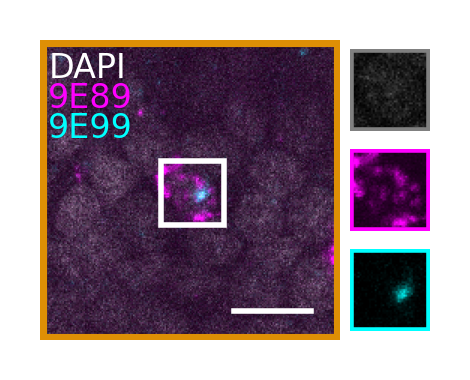

In [144]:
# U34-B3-546 Chymotrypsin-B2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="9E89", c2_name="9E99",
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0.2, 1.4], [0.7, 0.3]],
                dapi_max=150, c1_max=100, c2_max=200)

## 9E99 & LOC105286072

In [9]:
input = 'LOC105286072'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250508 P14 T 9E99-b2-594 LOC105286072-B5-647 DAPI as input directory


In [10]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [11]:
channels = ['AF594', 'AF647']
channel_names = ["9E99", "LOC105286072"]
channel_colors = ["cyan", "yellow"]
channel_maxs = [255, 255]

In [12]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250508 9e99 loc072 sample 4.czi,32,1,225,445.0,AF594,0.756313,AF594,1.000928,9E99,9E99 valence OR
1,20250508 9e99 loc072 sample 4.czi,34,78,201,319.0,AF594,0.453729,AF594,0.892546,9E99,9E99 valence OR
2,20250508 9e99 loc072 sample 4.czi,35,90,220,627.0,AF594,0.509946,AF594,1.237258,9E99,9E99 valence OR
3,20250508 9e99 loc072 sample 4.czi,36,98,229,682.0,AF594,0.647410,AF594,1.351173,9E99,9E99 valence OR
4,20250508 9e99 loc072 sample 4.czi,45,31,249,668.0,AF594,0.341295,AF594,1.283846,9E99,9E99 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
557,20250508 9e99 loc072 sample 1.czi,79,15,181,444.0,AF647,0.399285,AF647,1.472745,LOC105286072,LOC105286072 valence OR
558,20250508 9e99 loc072 sample 1.czi,79,16,220,609.0,AF647,0.451345,AF647,0.787752,LOC105286072,LOC105286072 valence OR
559,20250508 9e99 loc072 sample 1.czi,80,7,266,713.0,AF647,0.268811,AF647,1.583504,LOC105286072,LOC105286072 valence OR
560,20250508 9e99 loc072 sample 1.czi,80,11,165,682.0,AF647,0.363320,AF647,0.739298,LOC105286072,LOC105286072 valence OR


<Axes: >

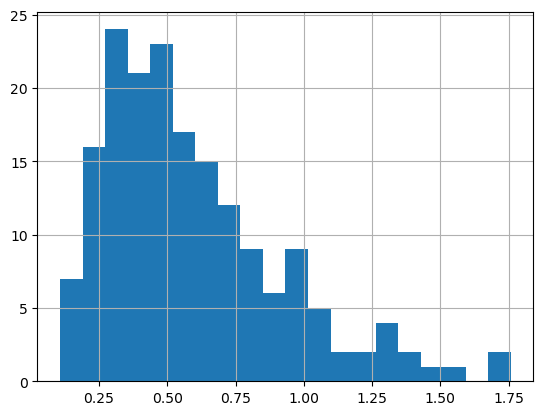

In [13]:
results_melted.loc[(results_melted['valence_OR_name'] == "9E99 valence OR") & 
                   (results_melted['channel_name'] == "LOC105286072")]['nuc-norm'].hist(bins=20)

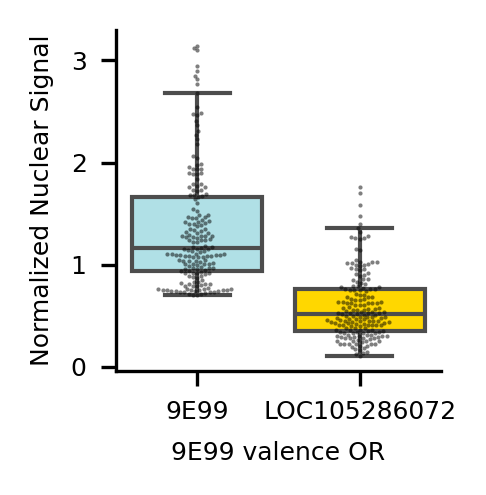

In [14]:
valence_channel = "9E99 valence OR"
channels_to_plot = ["9E99", "LOC105286072"]
plot_colors = ['powderblue', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

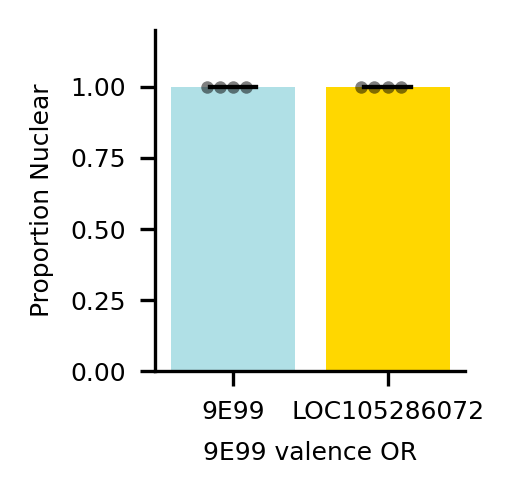

In [15]:
valence_channel = "9E99 valence OR"
channels_to_plot = ["9E99", "LOC105286072"]
plot_colors = ['powderblue', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

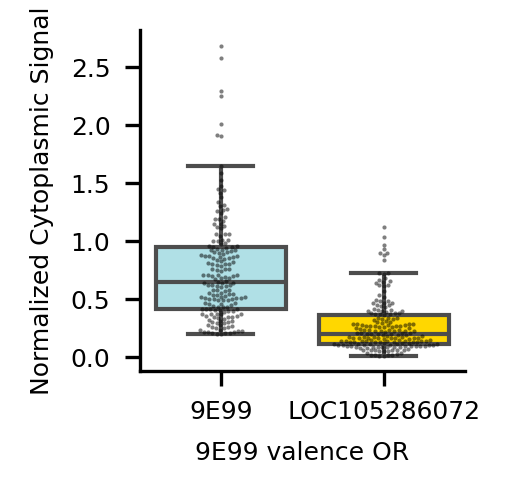

In [16]:
valence_channel = "9E99 valence OR"
channels_to_plot = ["9E99", "LOC105286072"]
plot_colors = ['powderblue', 'gold']
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

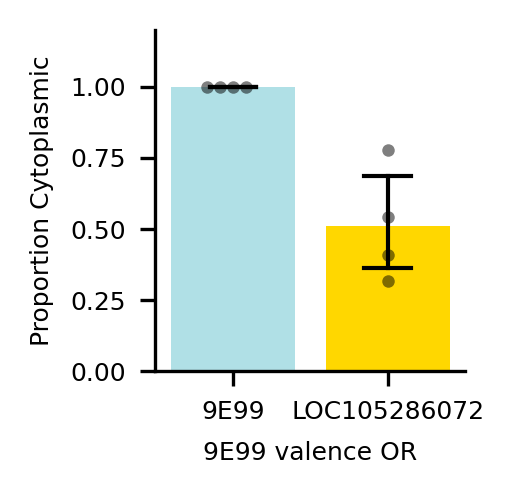

In [17]:
valence_channel = "9E99 valence OR"
channels_to_plot = ["9E99", "LOC105286072"]
plot_colors = ['powderblue', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [18]:
# Correlation 
from scipy.stats import pearsonr
r, p = pearsonr(results_subset.loc[results_subset['channel_name'] == "LOC105286072"]['cyto-norm'].values, results_subset.loc[results_subset['channel_name'] == "9E99"]['nuc-norm'].values)
print(f"Pearson correlation of LOC105286072 normalized cytoplasmic signal with 9E99 normalized nuclear signal in cells with 9E99 valence OR: {r}, p-value: {p}")

r, p = pearsonr(results_subset.loc[results_subset['channel_name'] == "LOC105286072"]['nuc-norm'].values, results_subset.loc[results_subset['channel_name'] == "9E99"]['nuc-norm'].values)
print(f"Pearson correlation of LOC105286072 normalized nuclear signal with 9E99 normalized nuclear signal in cells with 9E99 valence OR: {r}, p-value: {p}")

Pearson correlation of LOC105286072 normalized cytoplasmic signal with 9E99 normalized nuclear signal in cells with 9E99 valence OR: 0.49196234500848424, p-value: 3.081993495725571e-12
Pearson correlation of LOC105286072 normalized nuclear signal with 9E99 normalized nuclear signal in cells with 9E99 valence OR: 0.4799001833857087, p-value: 1.2181254408757845e-11


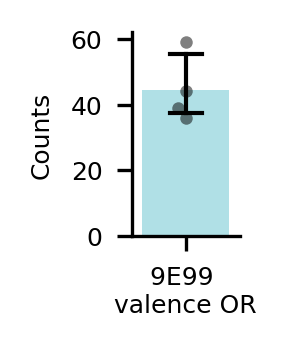

In [19]:
# Plot the number of cells 
valence_ORs = ['9E99 valence OR']
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts = valence_counts[valence_counts['valence_OR_name'].isin(valence_ORs)]
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=['powderblue', 'gold'], saturation=1,
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [20]:
file_number = 0
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250508 P14 T 9E99-b2-594 LOC105286072-B5-647 DAPI/20250508 9e99 loc072 sample 1.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF647-T1', 'DAPI-T2', 'AF594-T2']}
Image shape: (1, 91, 3, 2048, 2048)
Loaded ../results/20250508 P14 T 9E99-b2-594 LOC105286072-B5-647 DAPI/20250508 9e99 loc072 sample 1_rois.npy
Loaded ../results/20250508 P14 T 9E99-b2-594 LOC105286072-B5-647 DAPI/20250508 9e99 loc072 sample 1_cell_borders.npy


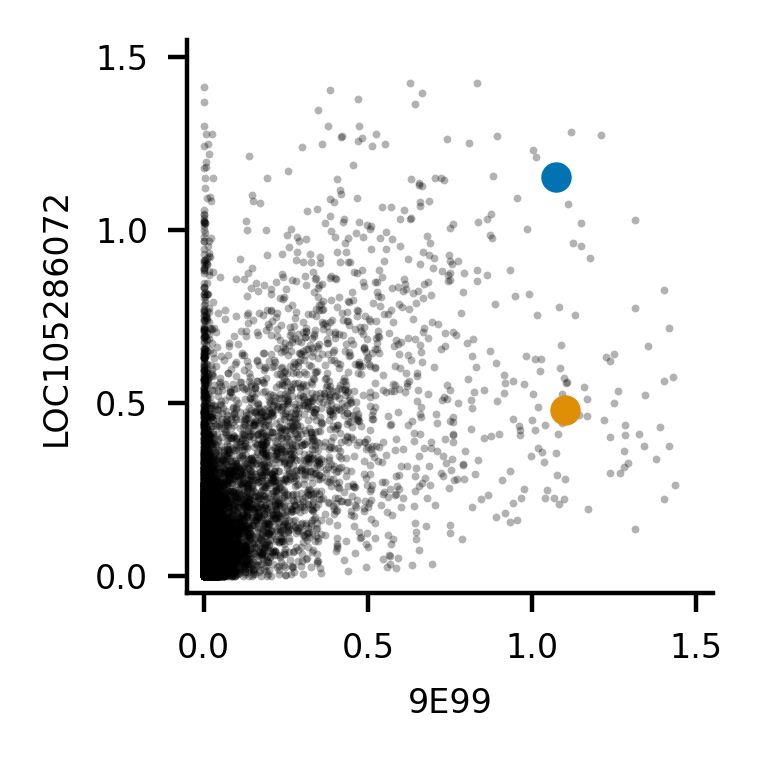

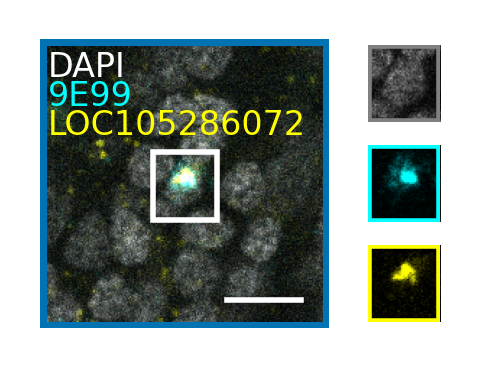

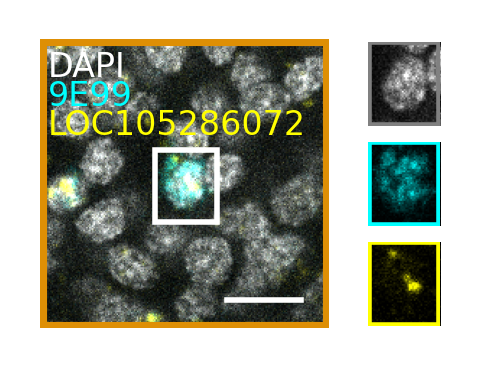

In [39]:
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF594-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="9E99", c2_name="LOC105286072",
                c1_color="cyan", c2_color="yellow",
                coordinates=[[1.2, 1.2],[1.1, 0.5]], bbox_expansion=8, 
                dapi_max=255, c1_max=200, c2_max=200)

## 9E213 & 9E214 & Intergenic

In [6]:
input = '20250523 A'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250523 A P14 T 9E213-546 9E214-488 Intergenic-647 DAPI as input directory


In [7]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [8]:
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["9E214", "9E213", "Intergenic"]
channel_colors = ["yellow", "cyan", "magenta"]
channel_maxs = [255, 255, 255]

In [10]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,sample 3 stack 2048p.czi,35,682,221,698.0,AF488,0.625765,AF488,1.952509,9E214,9E214 valence OR
1,sample 3 stack 2048p.czi,36,665,192,563.0,AF488,0.425846,AF488,2.004844,9E214,9E214 valence OR
2,sample 3 stack 2048p.czi,37,18,207,713.0,AF488,0.461797,AF488,1.105710,9E214,9E214 valence OR
3,sample 3 stack 2048p.czi,37,644,174,414.0,AF488,1.065653,AF488,2.027605,9E214,9E214 valence OR
4,sample 3 stack 2048p.czi,38,13,203,795.0,AF488,0.594600,AF488,1.500652,9E214,9E214 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
787,sample 5 stack 2048p.czi,74,73,249,586.0,AF647,0.201916,AF647,1.190638,Intergenic,Intergenic valence OR
788,sample 5 stack 2048p.czi,74,124,176,418.0,AF647,0.573136,AF647,0.950989,Intergenic,Intergenic valence OR
789,sample 5 stack 2048p.czi,74,197,206,307.0,AF647,0.511731,AF647,0.969881,Intergenic,Intergenic valence OR
790,sample 5 stack 2048p.czi,75,71,197,427.0,AF647,0.235855,AF647,1.397012,Intergenic,Intergenic valence OR


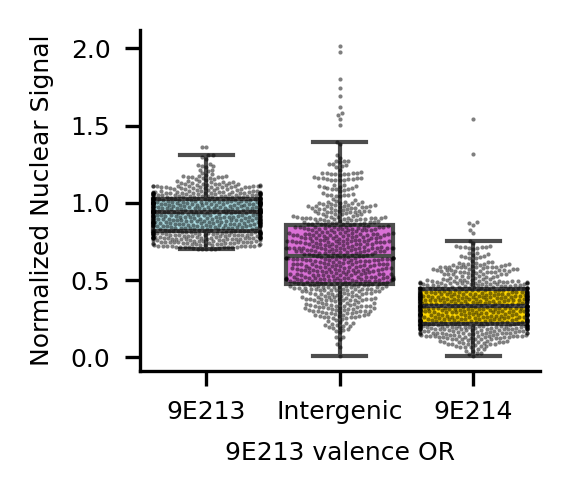

In [18]:
valence_channel = "9E213 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(2, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

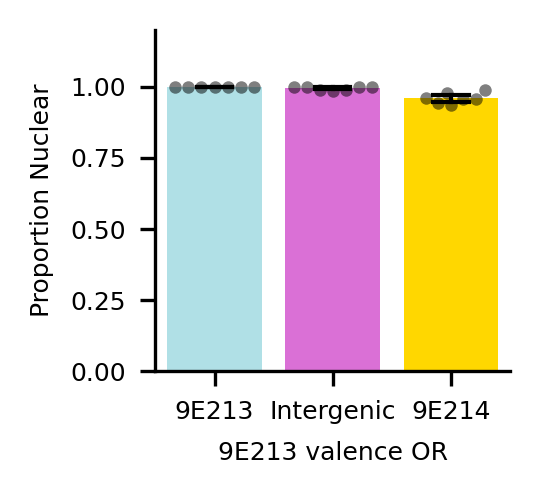

In [19]:
valence_channel = "9E213 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.9, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

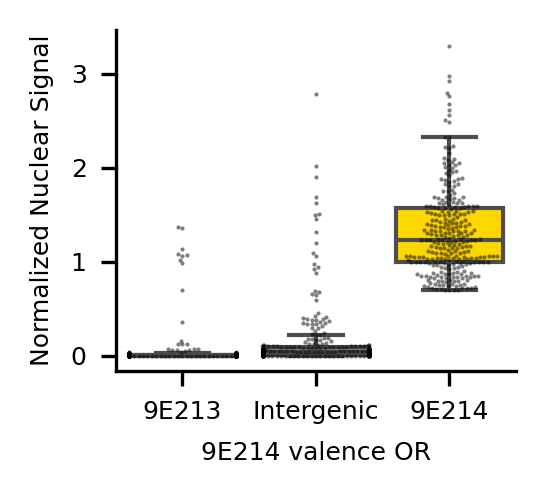

In [20]:
valence_channel = "9E214 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(2, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

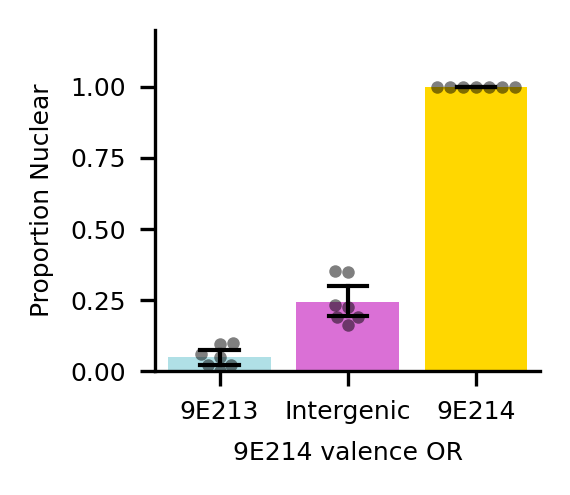

In [21]:
valence_channel = "9E214 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(2, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

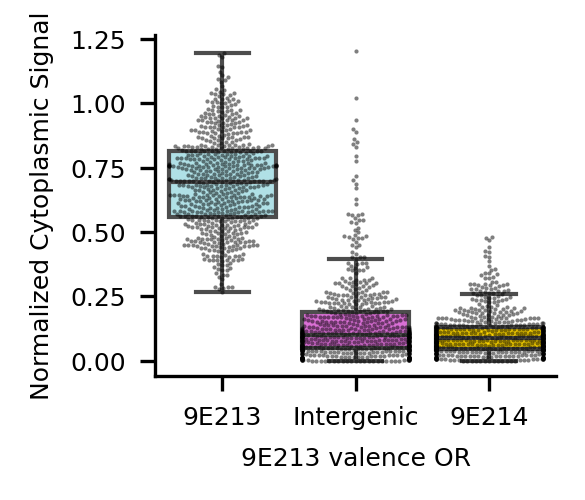

In [35]:
valence_channel = "9E213 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(2, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

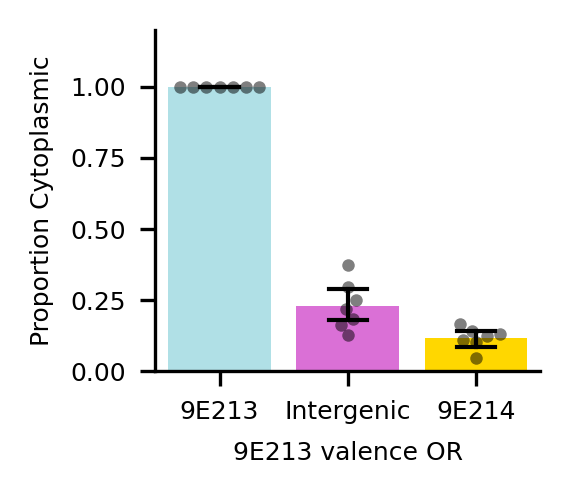

In [23]:
valence_channel = "9E213 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(2, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

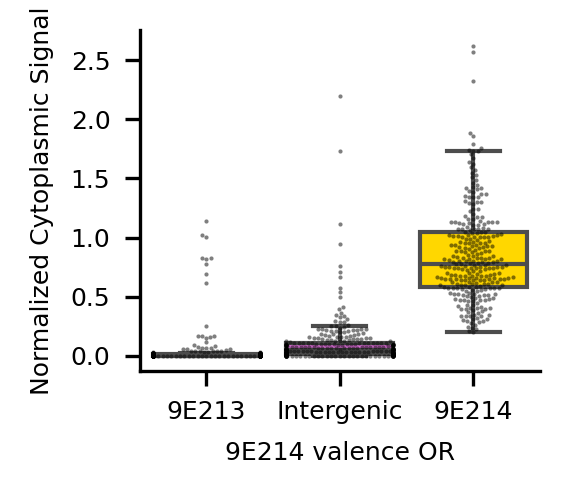

In [24]:
valence_channel = "9E214 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
f, ax = plt.subplots(1, 1, figsize=(2, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=['gold', 'orchid', 'gold'], order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

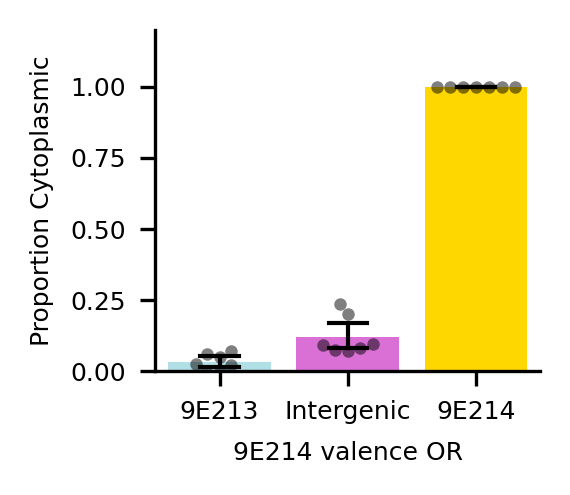

In [25]:
valence_channel = "9E214 valence OR"
channels_to_plot = ["9E213", "Intergenic", "9E214"]
plot_colors =['powderblue', 'orchid', 'gold']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(2, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

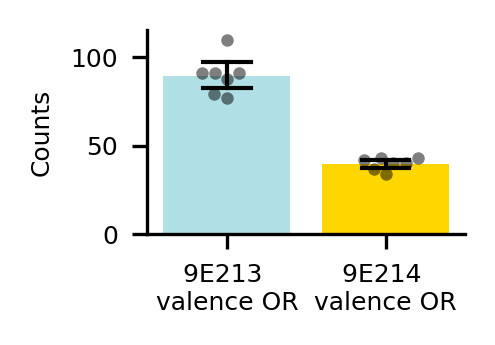

In [26]:
# Plot the number of cells 
valence_ORs = ["9E213 valence OR", "9E214 valence OR"]
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts = valence_counts[valence_counts["valence_OR_name"].isin(valence_ORs)]
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=['powderblue', 'gold'], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [27]:
file_number = 0 
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250523 A P14 T 9E213-546 9E214-488 Intergenic-647 DAPI/sample 2 stack 2048p.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 96, 4, 2048, 2048)
Loaded ../results/20250523 A P14 T 9E213-546 9E214-488 Intergenic-647 DAPI/sample 2 stack 2048p_rois.npy
Loaded ../results/20250523 A P14 T 9E213-546 9E214-488 Intergenic-647 DAPI/sample 2 stack 2048p_cell_borders.npy


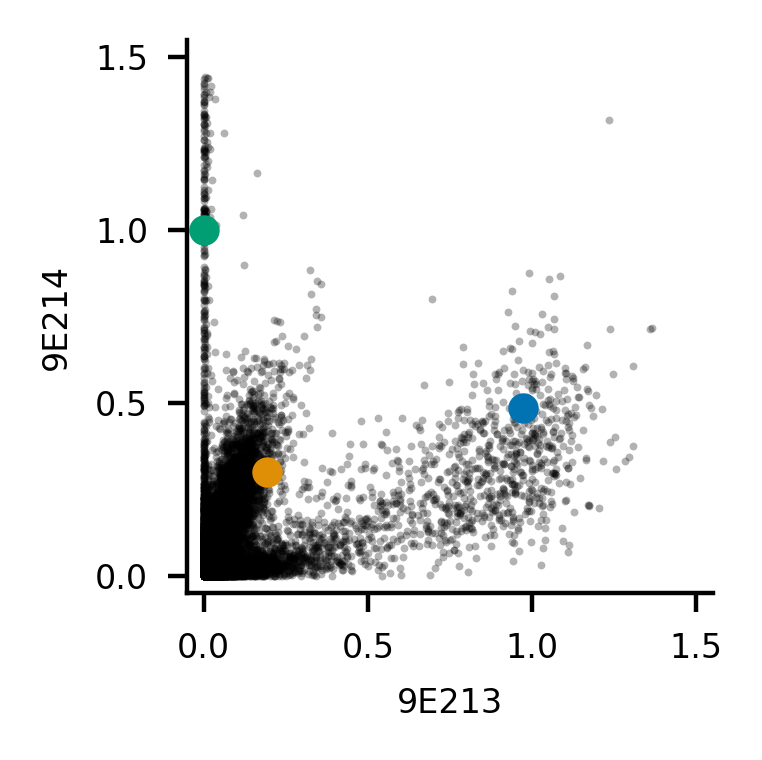

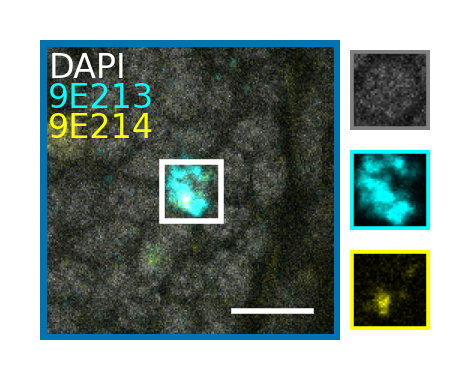

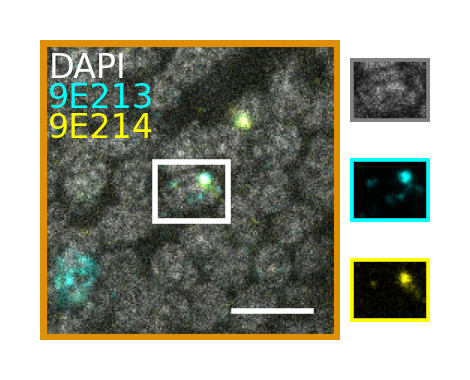

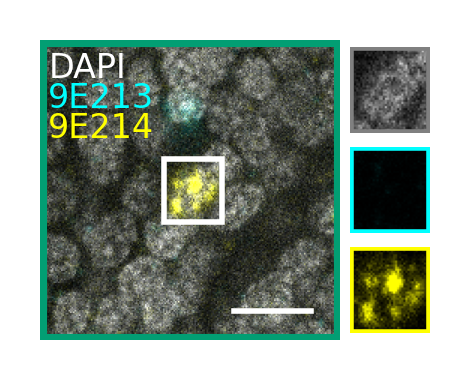

In [32]:
# 9E213-546 9E214-488 Intergenic-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF488-nuc-norm", 
                c1_name="9E213", c2_name="9E214",
                c1_color="cyan", c2_color="yellow",
                coordinates=[[1, 0.5], [0.2, 0.3], [0, 1]],
                dapi_max=200, c1_max=200, c2_max=150)

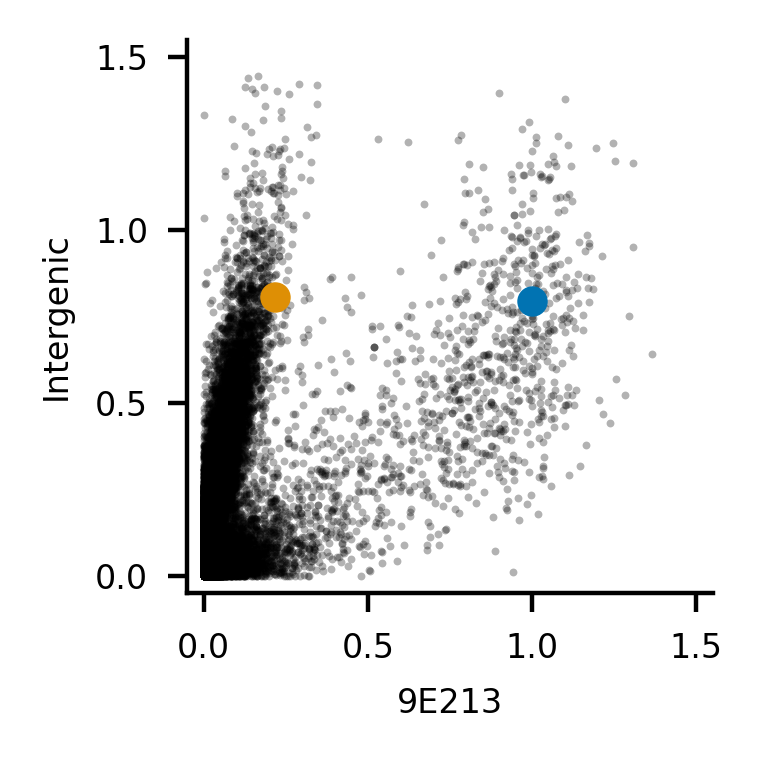

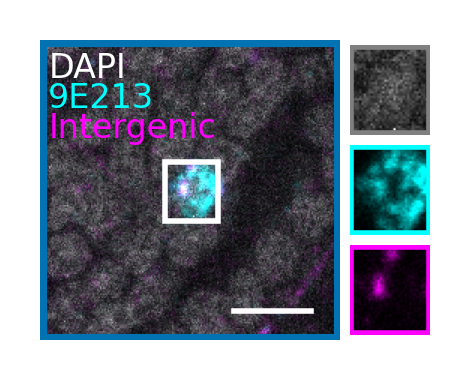

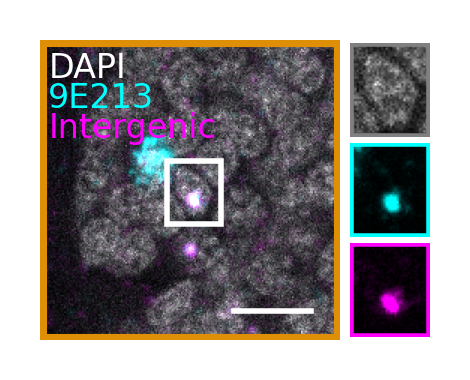

In [34]:
# 9E213-546 9E214-488 Intergenic-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="9E213", c2_name="Intergenic",
                c1_color="cyan", c2_color="magenta",
                coordinates=[[1, 0.8], [0.2, 0.8]],
                dapi_max=200, c1_max=200, c2_max=150)

## 9E88 & LncRNA

In [36]:
input = '20250523 B'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250523 B P14 T 9E88-546 Lnc-647 DAPI as input directory


In [37]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [38]:
channels = ['AF546', 'AF647']
channel_names = ["9E88", "PR"]
channel_colors = ["yellow", "magenta"]
channel_maxs = [255, 255]

In [39]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250523 B sample 6 stack.czi,17,80,138,620.0,AF546,0.454943,AF546,0.795205,9E88,9E88 valence OR
1,20250523 B sample 6 stack.czi,18,80,151,526.0,AF546,0.435312,AF546,1.055915,9E88,9E88 valence OR
2,20250523 B sample 6 stack.czi,19,83,133,369.0,AF546,0.496948,AF546,0.776500,9E88,9E88 valence OR
3,20250523 B sample 6 stack.czi,19,142,140,455.0,AF546,0.527817,AF546,0.999808,9E88,9E88 valence OR
4,20250523 B sample 6 stack.czi,20,168,231,720.0,AF546,0.653567,AF546,1.085758,9E88,9E88 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
261,20250523 B sample 3 stack.czi,59,105,235,517.0,AF647,0.291373,AF647,1.379186,PR,PR valence OR
262,20250523 B sample 3 stack.czi,62,81,234,530.0,AF647,0.662476,AF647,1.291998,PR,PR valence OR
263,20250523 B sample 3 stack.czi,63,72,273,652.0,AF647,0.530683,AF647,1.233386,PR,PR valence OR
264,20250523 B sample 3 stack.czi,64,57,210,392.0,AF647,0.614505,AF647,1.823894,PR,PR valence OR


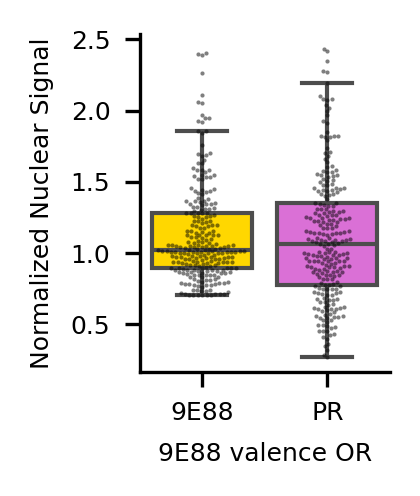

In [45]:
valence_channel = "9E88 valence OR"
channels_to_plot = ["9E88", "PR"]
plot_colors = ['gold', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

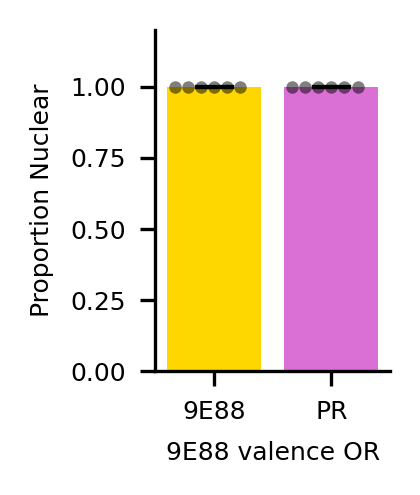

In [44]:
valence_channel = "9E88 valence OR"
channels_to_plot = ["9E88", "PR"]
plot_colors = ['gold', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

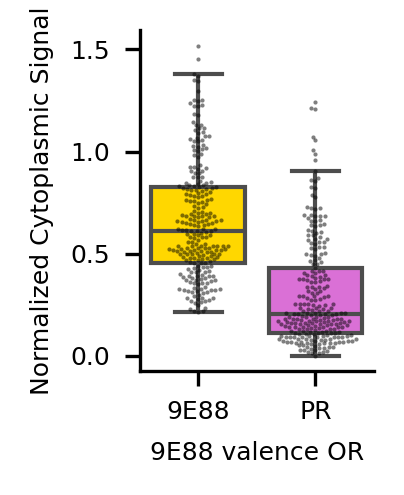

In [43]:
valence_channel = "9E88 valence OR"
channels_to_plot = ["9E88", "PR"]
plot_colors = ['gold', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

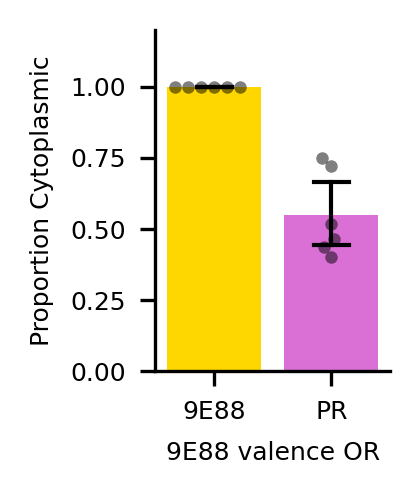

In [46]:
valence_channel = "9E88 valence OR"
channels_to_plot = ["9E88", "PR"]
plot_colors = ['gold', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

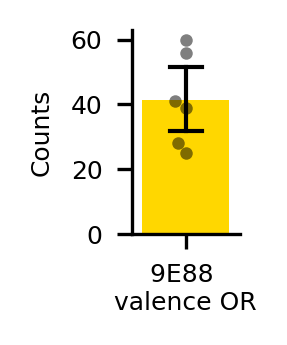

In [47]:
# Plot the number of cells 
valence_ORs = ['9E88 valence OR']
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts = valence_counts[valence_counts['valence_OR_name'].isin(valence_ORs)]
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=['gold'], saturation=1,
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [48]:
file_number = 0
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250523 B P14 T 9E88-546 Lnc-647 DAPI/20250523 B sample 2 stack.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 85, 3, 2048, 2048)
Loaded ../results/20250523 B P14 T 9E88-546 Lnc-647 DAPI/20250523 B sample 2 stack_rois.npy
Loaded ../results/20250523 B P14 T 9E88-546 Lnc-647 DAPI/20250523 B sample 2 stack_cell_borders.npy


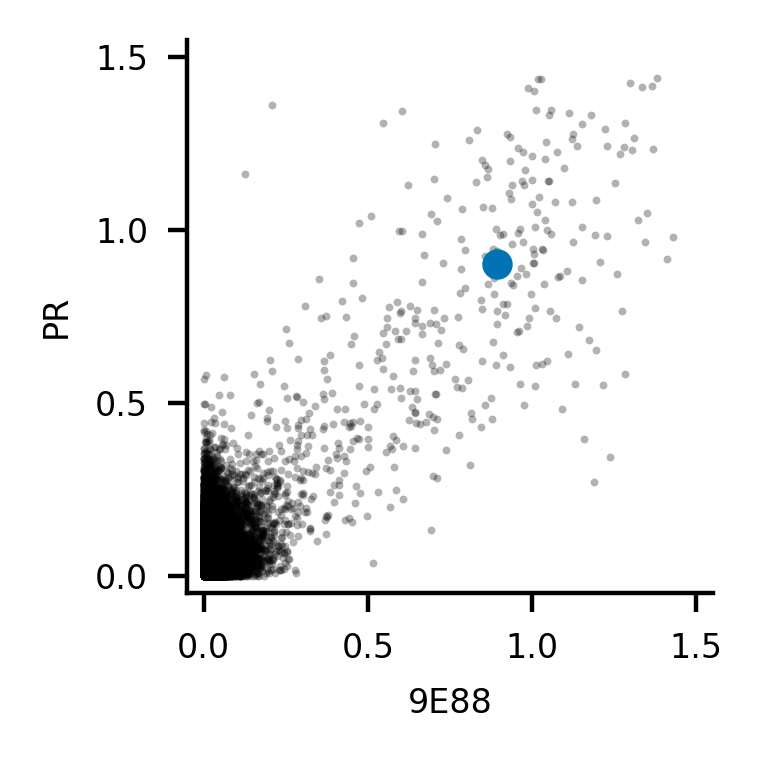

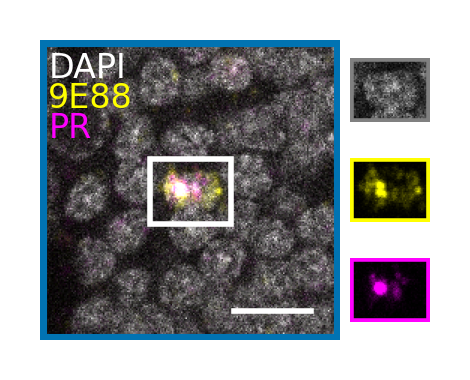

In [53]:
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF546-nuc-norm", c2="AF647-nuc-norm", 
                c1_name="9E88", c2_name="PR",
                c1_color="yellow", c2_color="magenta",
                coordinates=[[0.9, 0.9]], bbox_expansion=8, 
                dapi_max=255, c1_max=200, c2_max=200)

## U54 & PR

In [54]:
input = '20250523 C'
input = [d for d in raw_data_dirs if input in d][0]
print(f'Using {input} as input directory')
# Load the results 
results_dir = f'../results/{input}'
results_path = os.path.join(results_dir, 'all_results_nuclei_cytoplasm_markers.csv')
results = pd.read_csv(results_path)

Using 20250523 C P14 T U54-647 Lnc4-546 DAPI as input directory


In [55]:
figure_dir = f'../figures/model_B_only_OSNs/{input}'
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
# Clear directory of files and subdirectories 
for f in os.listdir(figure_dir):
    if os.path.isfile(os.path.join(figure_dir, f)):
        os.remove(os.path.join(figure_dir, f))
    elif os.path.isdir(os.path.join(figure_dir, f)):
        for subf in os.listdir(os.path.join(figure_dir, f)):
            os.remove(os.path.join(figure_dir, f, subf))
        os.rmdir(os.path.join(figure_dir, f))

In [56]:
channels = ['AF647', 'AF546']
channel_names = ["U54", "PR"]
channel_colors = ["yellow", "magenta"]
channel_maxs = [255, 255]

In [57]:
# Normalize the nucleus mean signal for each channel and each image 
for channel in channels: 
    for image in results['image'].unique(): 
        nucleus_mean_signal = results.loc[results['image'] == image][f'{channel}-nucleus-mean'].values
        lower = np.quantile(nucleus_mean_signal, normalization_quantile)
        upper = np.quantile(nucleus_mean_signal, 1 - normalization_quantile)
        results.loc[results['image'] == image, f'{channel}-nuc-norm'] = (nucleus_mean_signal - lower) / (upper - lower)
        cyto_mean_signal = results.loc[results['image'] == image][f'{channel}-cyto-mean'].values
        results.loc[results['image'] == image, f'{channel}-cyto-norm'] = (cyto_mean_signal - lower) / (upper - lower)

# Assign cytoplasmic annotations based on border pixels, nuclear area, normalized signals 
for channel in channels: 
    results[f'{channel}-cytoplasmic'] = (results['border_pxls'] > valence_OR_border_threshold) & (results['nucleus_area'] > valence_OR_nuc_norm_threshold) & (results[f'{channel}-cyto-norm'] > cyto_norm_threshold) & (results[f'{channel}-nuc-norm'] > valence_OR_nuc_norm_threshold)


results_melted = []
for channel in channels: 
    results_subset_cytoplasmic = results[results[f'{channel}-cytoplasmic']]

    # Get cytoplasmic celsl melted 
    melted_cyto = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-cyto-norm" for c in channels], var_name='channel', value_name='cyto-norm')
    melted_cyto['channel'] = melted_cyto['channel'].str.replace('-cyto-norm', '')
    melted_cyto['cytoplasmic_channel'] = channel

    # Get nucleus cells melted
    melted_nuc = results_subset_cytoplasmic.melt(id_vars=['image', 'z', 'z_id', 'border_pxls', 'nucleus_area'], 
                                             value_vars=[c+"-nuc-norm" for c in channels], var_name='channel', value_name='nuc-norm')
    melted_nuc['channel'] = melted_nuc['channel'].str.replace('-nuc-norm', '')
    melted_nuc['cytoplasmic_channel'] = channel

    # Merge melted dataframes
    melted_merged = pd.merge(melted_cyto, melted_nuc, on=['image', 'z', 'z_id', 'cytoplasmic_channel', 'channel', 'border_pxls', 'nucleus_area'])

    # Assign names 
    melted_merged['channel_name'] = melted_merged['channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['cytoplasmic_channel'].map(dict(zip(channels, channel_names)))
    melted_merged['valence_OR_name'] = melted_merged['valence_OR_name'] + " valence OR"

    # Save to results_melted 
    results_melted.append(melted_merged)

# Concatenate all melted dataframes
results_melted = pd.concat(results_melted, axis=0)
results_melted

,image,z,z_id,border_pxls,nucleus_area,channel,cyto-norm,cytoplasmic_channel,nuc-norm,channel_name,valence_OR_name
0,20250523 C sample 4 stack.czi,2,43,285,727.0,AF647,0.677432,AF647,1.005105,U54,U54 valence OR
1,20250523 C sample 4 stack.czi,6,83,242,745.0,AF647,0.647393,AF647,0.908117,U54,U54 valence OR
2,20250523 C sample 4 stack.czi,6,124,240,749.0,AF647,0.604262,AF647,0.735382,U54,U54 valence OR
3,20250523 C sample 4 stack.czi,7,100,193,645.0,AF647,0.513912,AF647,0.730499,U54,U54 valence OR
4,20250523 C sample 4 stack.czi,7,145,200,508.0,AF647,0.507310,AF647,0.713507,U54,U54 valence OR
...,...,...,...,...,...,...,...,...,...,...,...
233,20250523 C sample 2 stack.czi,76,23,210,394.0,AF546,0.350553,AF546,1.334204,PR,PR valence OR
234,20250523 C sample 2 stack.czi,79,8,259,580.0,AF546,0.310104,AF546,0.708657,PR,PR valence OR
235,20250523 C sample 2 stack.czi,79,31,252,531.0,AF546,0.257164,AF546,0.983425,PR,PR valence OR
236,20250523 C sample 2 stack.czi,80,2,241,526.0,AF546,0.342020,AF546,0.987748,PR,PR valence OR


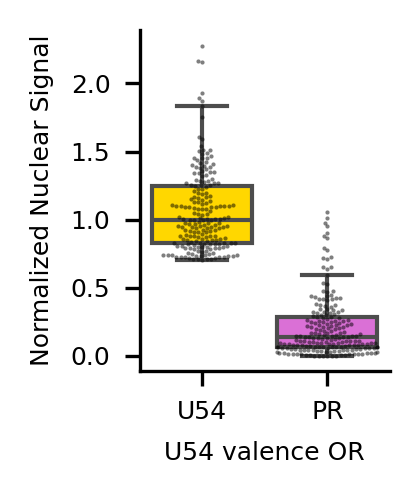

In [58]:
valence_channel = "U54 valence OR"
channels_to_plot = ["U54", "PR"]
plot_colors = ['gold', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="nuc-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Nuclear Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-norm-nuc.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

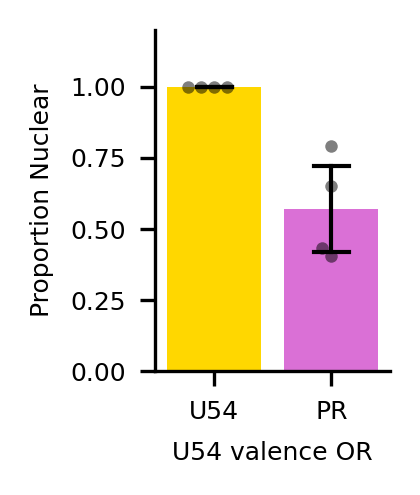

In [60]:
valence_channel = "U54 valence OR"
channels_to_plot = ["U54", "PR"]
plot_colors = ['gold', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='nuclear')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['nuc-norm'].count().values
results_thresholded['prop-nuclear'] = results_thresholded['nuclear'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-nuclear", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Nuclear", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-nuclear-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

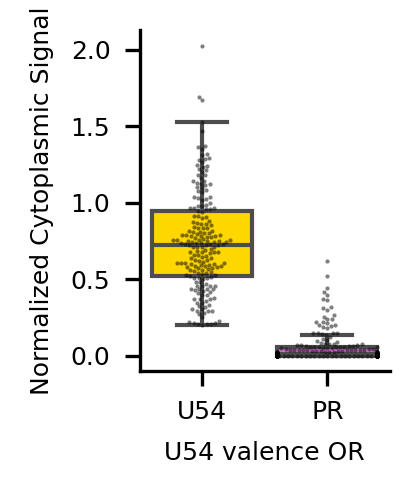

In [61]:
valence_channel = "U54 valence OR"
channels_to_plot = ["U54", "PR"]
plot_colors = ['gold', 'orchid']
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
sns.boxplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, showfliers=False)
sns.swarmplot(data=results_subset, x="channel_name", y="cyto-norm", ax=ax, color='black', alpha=0.5, s=1, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Normalized Cytoplasmic Signal", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-rel-cyto.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

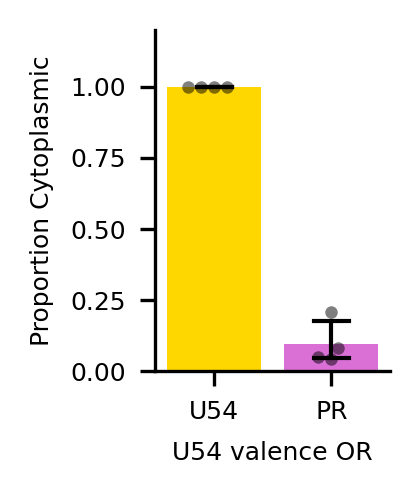

In [62]:
valence_channel = "U54 valence OR"
channels_to_plot = ["U54", "PR"]
plot_colors = ['gold', 'orchid']
results_subset = results_melted[(results_melted["valence_OR_name"] == valence_channel) & (results_melted["channel_name"].isin(channels_to_plot))]
results_thresholded = results_subset.groupby(['image', 'channel_name']).apply(lambda x: ((x['cyto-norm'] > cyto_norm_threshold) & (x['nuc-norm'] > coexpression_nuc_norm_threshold)).sum()).reset_index(name='cytoplasmic')
results_thresholded['total_cells'] = results_subset.groupby(['image', 'channel_name'])['cyto-norm'].count().values
results_thresholded['prop-cytoplasmic'] = results_thresholded['cytoplasmic'] / results_thresholded['total_cells']

f, ax = plt.subplots(1, 1, figsize=(1.5, 1.75), dpi = 300) 
sns.barplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, palette=plot_colors, order=channels_to_plot, saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=results_thresholded, x="channel_name", y="prop-cytoplasmic", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True) 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"{valence_channel}", fontsize=6)
ax.set_ylabel("Proportion Cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.set_ylim(0, 1.2)
ax.set_yticks([0, 0.25, 0.5, 0.75, 1])

plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-{valence_channel}-cyto-proportion.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

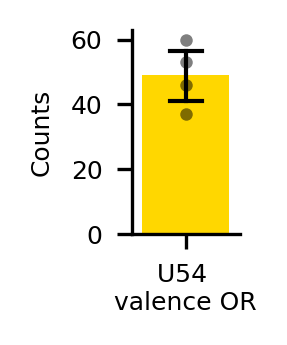

In [64]:
# Plot the number of cells 
valence_ORs = ['U54 valence OR']
valence_counts = results_melted.groupby(['image', 'valence_OR_name']).size().reset_index(name='num_cells')
valence_counts['num_cells'] = valence_counts['num_cells'] / len(results_melted['channel'].unique())
valence_counts = valence_counts[valence_counts['valence_OR_name'].isin(valence_ORs)]
valence_counts['valence_OR_name'] = valence_counts['valence_OR_name'].str.replace('valence OR', '\nvalence OR')
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 300) 
sns.barplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, palette=['gold'], saturation=1,
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=valence_counts, x="valence_OR_name", y="num_cells", ax=ax, color='black', alpha=0.5, s=3, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel(f"", fontsize=6)
ax.set_ylabel("Counts", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

In [65]:
file_number = 0
results_files = os.listdir(f'../../../RNA-FISH-raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../../../RNA-FISH-raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

# Load cell_borders 
cell_borders_path = f'../results/{input}/{image.replace(".czi", "_cell_borders.npy")}'
cell_borders = np.load(cell_borders_path)
print(f"Loaded {cell_borders_path}")

Loaded ../../../RNA-FISH-raw-data/20250523 C P14 T U54-647 Lnc4-546 DAPI/20250523 C sample 4 stack.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 94, 3, 2048, 2048)
Loaded ../results/20250523 C P14 T U54-647 Lnc4-546 DAPI/20250523 C sample 4 stack_rois.npy
Loaded ../results/20250523 C P14 T U54-647 Lnc4-546 DAPI/20250523 C sample 4 stack_cell_borders.npy


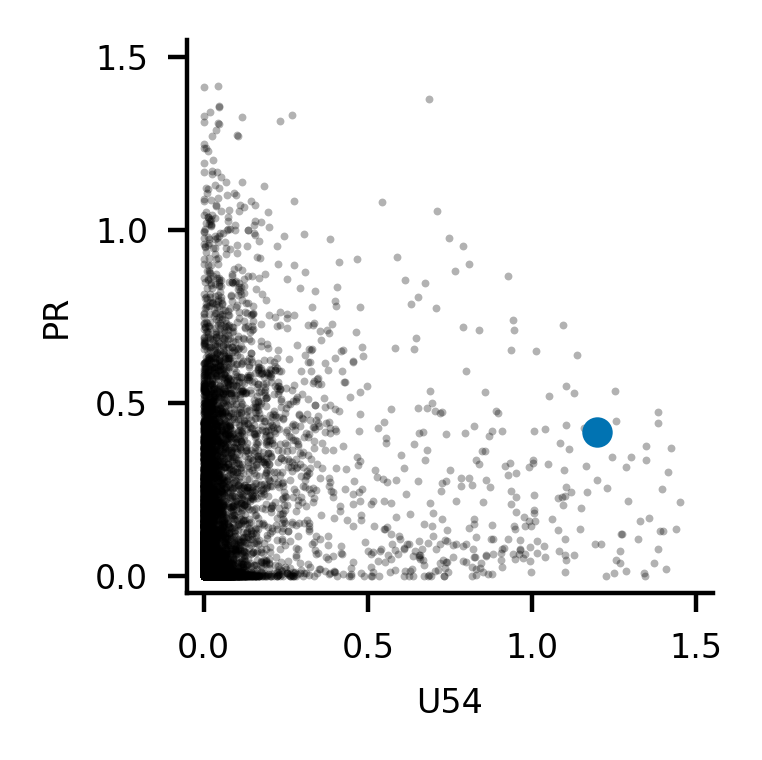

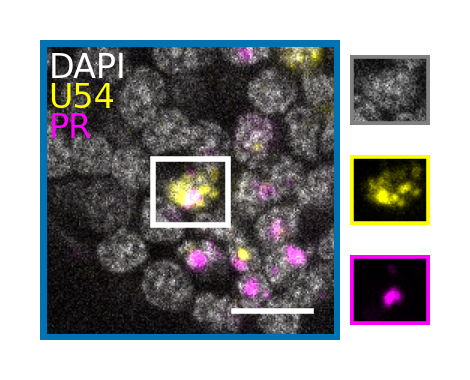

In [69]:
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, cell_borders=cell_borders, input=input, file=image, 
                c1="AF647-nuc-norm", c2="AF546-nuc-norm", 
                c1_name="U54", c2_name="PR",
                c1_color="yellow", c2_color="magenta",
                coordinates=[[1.2, 0.4]], bbox_expansion=8, 
                dapi_max=255, c1_max=200, c2_max=200)